In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 3
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when ONI is removed as a predictor
df_trimmed = df_trimmed.drop(['ONI'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 3
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  10

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

3
179
(84, 1972)
(11, 1972)


[I 2025-05-20 23:46:43,207] A new study created in memory with name: no-name-c377f578-0505-44eb-a9b8-73dc997fae7d
[I 2025-05-20 23:50:50,327] Trial 0 finished with value: 0.08784591257572175 and parameters: {'lr': 0.029474487713649966, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.12990782736227768}. Best is trial 0 with value: 0.08784591257572175.


Cross Validation Accuracies:
[0.08564519137144089, 0.06258423626422882, 0.09813124686479568, 0.11618928611278534, 0.07667960226535797]
Mean Cross Validation Accuracy:
0.08784591257572175
Standard Deviation of Cross Validation Accuracy:
0.018312929174397346


[I 2025-05-20 23:53:49,498] Trial 1 finished with value: 0.08031085133552551 and parameters: {'lr': 0.001981254889692898, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.11198122150235995}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06026860699057579, 0.060445498675107956, 0.0920858383178711, 0.10697431862354279, 0.08177999407052994]
Mean Cross Validation Accuracy:
0.08031085133552551
Standard Deviation of Cross Validation Accuracy:
0.01815529113693757


[I 2025-05-20 23:56:22,897] Trial 2 finished with value: 0.13604919314384462 and parameters: {'lr': 0.016260394059223738, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.19944673163469742}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.13746468722820282, 0.1623862385749817, 0.12945972383022308, 0.15140335261821747, 0.09953196346759796]
Mean Cross Validation Accuracy:
0.13604919314384462
Standard Deviation of Cross Validation Accuracy:
0.021486381583561316


[I 2025-05-21 00:03:00,784] Trial 3 finished with value: 0.7241914331912994 and parameters: {'lr': 0.1957753487779905, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.37974833010182807}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.6059592962265015, 2.0289275646209717, 0.5683251619338989, 0.2814808785915375, 0.13626426458358765]
Mean Cross Validation Accuracy:
0.7241914331912994
Standard Deviation of Cross Validation Accuracy:
0.6756123883005883


[I 2025-05-21 00:08:39,038] Trial 4 finished with value: 0.09113382548093796 and parameters: {'lr': 0.02395408626027468, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.20124020946789908}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06982215493917465, 0.06569976359605789, 0.12644532322883606, 0.10436224937438965, 0.08933963626623154]
Mean Cross Validation Accuracy:
0.09113382548093796
Standard Deviation of Cross Validation Accuracy:
0.022477504274662684


[I 2025-05-21 00:14:57,456] Trial 5 finished with value: 0.09850002229213714 and parameters: {'lr': 0.001340834259413965, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.48723071054683775}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.09814653545618057, 0.06804456561803818, 0.09264468401670456, 0.15120083093643188, 0.08246349543333054]
Mean Cross Validation Accuracy:
0.09850002229213714
Standard Deviation of Cross Validation Accuracy:
0.028271859528324828


[I 2025-05-21 00:19:44,052] Trial 6 finished with value: 3.906893253326416 and parameters: {'lr': 0.2416524061233637, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.49017945925574125}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[5.46205997467041, 3.7267439365386963, 2.7054951190948486, 4.170385837554932, 3.4697813987731934]
Mean Cross Validation Accuracy:
3.906893253326416
Standard Deviation of Cross Validation Accuracy:
0.9115755481345889


[I 2025-05-21 00:23:58,744] Trial 7 finished with value: 0.6304536461830139 and parameters: {'lr': 0.010054449165853104, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.32361688962452795}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.6413736939430237, 0.6470478773117065, 0.5684638023376465, 0.6645868420600891, 0.6307960152626038]
Mean Cross Validation Accuracy:
0.6304536461830139
Standard Deviation of Cross Validation Accuracy:
0.03287110879534138


[I 2025-05-21 00:33:16,189] Trial 8 finished with value: 0.10480074286460876 and parameters: {'lr': 0.5562494867503811, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.14021475341206768}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.0864601582288742, 0.15792272984981537, 0.0820242241024971, 0.10846178978681564, 0.0891348123550415]
Mean Cross Validation Accuracy:
0.10480074286460876
Standard Deviation of Cross Validation Accuracy:
0.02805678882643207


[I 2025-05-21 00:38:36,856] Trial 9 finished with value: 0.08770623505115509 and parameters: {'lr': 0.0018228477971473475, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.4542540876413995}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.07293567061424255, 0.06842614710330963, 0.09359026700258255, 0.10553128272294998, 0.09804780781269073]
Mean Cross Validation Accuracy:
0.08770623505115509
Standard Deviation of Cross Validation Accuracy:
0.014485811325231022


[I 2025-05-21 00:43:25,950] Trial 10 finished with value: 0.09817206561565399 and parameters: {'lr': 0.005598307782935777, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2531765832977587}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.08698714524507523, 0.10559064894914627, 0.09457561373710632, 0.10311157256364822, 0.10059534758329391]
Mean Cross Validation Accuracy:
0.09817206561565399
Standard Deviation of Cross Validation Accuracy:
0.006683461870480573


[I 2025-05-21 00:47:49,218] Trial 11 finished with value: 0.09332680404186249 and parameters: {'lr': 0.0010972051825475782, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3928761180972744}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.08442528545856476, 0.08701712638139725, 0.10549234598875046, 0.1126914992928505, 0.07700776308774948]
Mean Cross Validation Accuracy:
0.09332680404186249
Standard Deviation of Cross Validation Accuracy:
0.013478516208803658


[I 2025-05-21 00:52:53,572] Trial 12 finished with value: 0.08727381378412247 and parameters: {'lr': 0.0034596199711904906, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.41323717856174363}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06533582508563995, 0.058209165930747986, 0.08480774611234665, 0.13314692676067352, 0.09486940503120422]
Mean Cross Validation Accuracy:
0.08727381378412247
Standard Deviation of Cross Validation Accuracy:
0.026435378163700826


[I 2025-05-21 00:58:11,694] Trial 13 finished with value: 0.08342505469918252 and parameters: {'lr': 0.0045947210481855245, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.3168101507427873}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06038510426878929, 0.06062532961368561, 0.09295351058244705, 0.11768736690282822, 0.08547396212816238]
Mean Cross Validation Accuracy:
0.08342505469918252
Standard Deviation of Cross Validation Accuracy:
0.021538627210298943


[I 2025-05-21 01:03:52,859] Trial 14 finished with value: 0.08326348215341568 and parameters: {'lr': 0.004411011322158447, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.30567502071512437}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.0638643428683281, 0.071958988904953, 0.0938672125339508, 0.10774049162864685, 0.07888637483119965]
Mean Cross Validation Accuracy:
0.08326348215341568
Standard Deviation of Cross Validation Accuracy:
0.015715217669193156


[I 2025-05-21 01:09:32,769] Trial 15 finished with value: 0.11617204546928406 and parameters: {'lr': 0.08551598977160461, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.25240126790534134}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.09493890404701233, 0.08386824280023575, 0.15858285129070282, 0.1001068577170372, 0.1433633714914322]
Mean Cross Validation Accuracy:
0.11617204546928406
Standard Deviation of Cross Validation Accuracy:
0.02929340157891802


[I 2025-05-21 01:13:07,363] Trial 16 finished with value: 0.08484475463628768 and parameters: {'lr': 0.0029210951693904143, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.26412156028478057}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.07415610551834106, 0.06329315900802612, 0.092702217400074, 0.10912361741065979, 0.08494867384433746]
Mean Cross Validation Accuracy:
0.08484475463628768
Standard Deviation of Cross Validation Accuracy:
0.015683954807340948


[I 2025-05-21 01:16:40,882] Trial 17 finished with value: 0.08608129173517227 and parameters: {'lr': 0.011675530946294909, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.18328351855264563}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.0646870955824852, 0.07304485887289047, 0.09607435017824173, 0.101430244743824, 0.09516990929841995]
Mean Cross Validation Accuracy:
0.08608129173517227
Standard Deviation of Cross Validation Accuracy:
0.014461775516939864


[I 2025-05-21 01:20:16,804] Trial 18 finished with value: 0.08237291425466538 and parameters: {'lr': 0.06719377994404054, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.3361954739050248}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06607289612293243, 0.0645444393157959, 0.0939188078045845, 0.10489320755004883, 0.08243522047996521]
Mean Cross Validation Accuracy:
0.08237291425466538
Standard Deviation of Cross Validation Accuracy:
0.01564621525981659


[I 2025-05-21 01:24:24,526] Trial 19 finished with value: 0.08629887849092484 and parameters: {'lr': 0.05431782531396927, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35554535190734665}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.061939820647239685, 0.0673464834690094, 0.09393804520368576, 0.11047816276550293, 0.0977918803691864]
Mean Cross Validation Accuracy:
0.08629887849092484
Standard Deviation of Cross Validation Accuracy:
0.018588387366141594


[I 2025-05-21 01:32:58,935] Trial 20 finished with value: 0.09748399704694748 and parameters: {'lr': 0.06727691926548625, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10031655866012457}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.08790693432092667, 0.07729630172252655, 0.09618350863456726, 0.10649050027132034, 0.11954274028539658]
Mean Cross Validation Accuracy:
0.09748399704694748
Standard Deviation of Cross Validation Accuracy:
0.014619573842427703


[I 2025-05-21 01:37:33,417] Trial 21 finished with value: 0.08311517015099526 and parameters: {'lr': 0.005980776961390799, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.28854112061464576}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.062459852546453476, 0.06275008618831635, 0.09732792526483536, 0.10970993340015411, 0.08332805335521698]
Mean Cross Validation Accuracy:
0.08311517015099526
Standard Deviation of Cross Validation Accuracy:
0.018712070701100363


[I 2025-05-21 01:42:03,575] Trial 22 finished with value: 0.08502443507313728 and parameters: {'lr': 0.00813955842679962, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.35213174956630783}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.062106773257255554, 0.058595750480890274, 0.10558950155973434, 0.11263096332550049, 0.08619918674230576]
Mean Cross Validation Accuracy:
0.08502443507313728
Standard Deviation of Cross Validation Accuracy:
0.021955031294054204


[I 2025-05-21 01:47:31,006] Trial 23 finished with value: 0.0839891217648983 and parameters: {'lr': 0.0018126748572572992, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2818303270437491}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06462951749563217, 0.05901051685214043, 0.09854945540428162, 0.11588338017463684, 0.08187273889780045]
Mean Cross Validation Accuracy:
0.0839891217648983
Standard Deviation of Cross Validation Accuracy:
0.021130315153767676


[I 2025-05-21 01:51:27,445] Trial 24 finished with value: 0.08842746764421464 and parameters: {'lr': 0.14506637531690542, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.43229705709494437}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06534592807292938, 0.07623124122619629, 0.10423603653907776, 0.10667365044355392, 0.0896504819393158]
Mean Cross Validation Accuracy:
0.08842746764421464
Standard Deviation of Cross Validation Accuracy:
0.015911223768377693


[I 2025-05-21 01:55:25,277] Trial 25 finished with value: 0.14721979051828385 and parameters: {'lr': 0.9346600799803623, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.22213198851331212}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.1362658441066742, 0.1309192180633545, 0.11215931922197342, 0.18694736063480377, 0.16980721056461334]
Mean Cross Validation Accuracy:
0.14721979051828385
Standard Deviation of Cross Validation Accuracy:
0.02721545745924018


[I 2025-05-21 01:59:31,909] Trial 26 finished with value: 0.08057524040341377 and parameters: {'lr': 0.019178012865010967, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.16698787314606234}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06425868719816208, 0.05668560042977333, 0.09197746962308884, 0.10844509303569794, 0.08150935173034668]
Mean Cross Validation Accuracy:
0.08057524040341377
Standard Deviation of Cross Validation Accuracy:
0.01867916961465001


[I 2025-05-21 02:03:46,044] Trial 27 finished with value: 0.17900211215019227 and parameters: {'lr': 0.044411971058810555, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.15254774963228532}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.19794811308383942, 0.1566992849111557, 0.15914535522460938, 0.18503712117671967, 0.19618068635463715]
Mean Cross Validation Accuracy:
0.17900211215019227
Standard Deviation of Cross Validation Accuracy:
0.01778866265620685


[I 2025-05-21 02:11:40,863] Trial 28 finished with value: 0.1028423935174942 and parameters: {'lr': 0.1192976652899066, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.10618637830162939}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.0765380859375, 0.08638399839401245, 0.14819994568824768, 0.11553266644477844, 0.08755727112293243]
Mean Cross Validation Accuracy:
0.1028423935174942
Standard Deviation of Cross Validation Accuracy:
0.02613343031372617


[I 2025-05-21 02:16:53,973] Trial 29 finished with value: 0.08108107671141625 and parameters: {'lr': 0.028736986438435055, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.16994876185420588}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06333228945732117, 0.05783117190003395, 0.09525389224290848, 0.10405412316322327, 0.08493390679359436]
Mean Cross Validation Accuracy:
0.08108107671141625
Standard Deviation of Cross Validation Accuracy:
0.01788324011882742


[I 2025-05-21 02:24:09,017] Trial 30 finished with value: 0.12533100545406342 and parameters: {'lr': 0.029041628531281755, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.17110585020522093}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.12333491444587708, 0.11799079924821854, 0.17738303542137146, 0.1231953352689743, 0.0847509428858757]
Mean Cross Validation Accuracy:
0.12533100545406342
Standard Deviation of Cross Validation Accuracy:
0.029727359100170093


[I 2025-05-21 02:29:49,715] Trial 31 finished with value: 0.08589172288775444 and parameters: {'lr': 0.01902327614813698, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.12424950609745958}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.0651041716337204, 0.05587751045823097, 0.09581391513347626, 0.12141834944486618, 0.0912446677684784]
Mean Cross Validation Accuracy:
0.08589172288775444
Standard Deviation of Cross Validation Accuracy:
0.023333325297904974


[I 2025-05-21 02:34:37,038] Trial 32 finished with value: 0.08149299398064613 and parameters: {'lr': 0.033217265905474816, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.227864503463032}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06188248097896576, 0.05695483461022377, 0.09333214163780212, 0.11023645102977753, 0.08505906164646149]
Mean Cross Validation Accuracy:
0.08149299398064613
Standard Deviation of Cross Validation Accuracy:
0.019828071335647846


[I 2025-05-21 02:39:37,744] Trial 33 finished with value: 0.08195820674300194 and parameters: {'lr': 0.040888887159781014, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.21986847122008416}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06236279010772705, 0.0580432154238224, 0.09538480639457703, 0.1078585833311081, 0.08614163845777512]
Mean Cross Validation Accuracy:
0.08195820674300194
Standard Deviation of Cross Validation Accuracy:
0.019102415289318803


[I 2025-05-21 02:43:47,068] Trial 34 finished with value: 0.08174282610416413 and parameters: {'lr': 0.014715844483547335, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.16291650042201195}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06394320726394653, 0.059494197368621826, 0.09014283120632172, 0.10727708786725998, 0.08785680681467056]
Mean Cross Validation Accuracy:
0.08174282610416413
Standard Deviation of Cross Validation Accuracy:
0.017730015685836518


[I 2025-05-21 02:47:15,678] Trial 35 finished with value: 0.08122155666351319 and parameters: {'lr': 0.02609827662827569, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19227723416045794}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06273829936981201, 0.05802621692419052, 0.09409504383802414, 0.10911472141742706, 0.08213350176811218]
Mean Cross Validation Accuracy:
0.08122155666351319
Standard Deviation of Cross Validation Accuracy:
0.01910100280981521


[I 2025-05-21 02:50:55,234] Trial 36 finished with value: 0.08181709572672843 and parameters: {'lr': 0.021977005357051275, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19169404683097668}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.061124905943870544, 0.06092542037367821, 0.09069012105464935, 0.10956123471260071, 0.08678379654884338]
Mean Cross Validation Accuracy:
0.08181709572672843
Standard Deviation of Cross Validation Accuracy:
0.01864277211500895


[I 2025-05-21 02:55:11,418] Trial 37 finished with value: 1.4765142679214478 and parameters: {'lr': 0.30445520225160094, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.11773795232110544}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[3.5114638805389404, 0.9737191796302795, 0.8447059392929077, 0.564484179019928, 1.488198161125183]
Mean Cross Validation Accuracy:
1.4765142679214478
Standard Deviation of Cross Validation Accuracy:
1.0606545137082393


[I 2025-05-21 03:01:11,881] Trial 38 finished with value: 0.09359339997172356 and parameters: {'lr': 0.009156046779200344, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.14272063593253825}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.06780342757701874, 0.05619058385491371, 0.11381790786981583, 0.12315806746482849, 0.10699701309204102]
Mean Cross Validation Accuracy:
0.09359339997172356
Standard Deviation of Cross Validation Accuracy:
0.026558804408197766


[I 2025-05-21 03:05:37,783] Trial 39 finished with value: 0.15274518430233003 and parameters: {'lr': 0.015186943010183683, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.1325718636632301}. Best is trial 1 with value: 0.08031085133552551.


Cross Validation Accuracies:
[0.09147712588310242, 0.13585099577903748, 0.12947773933410645, 0.25179654359817505, 0.1551235169172287]
Mean Cross Validation Accuracy:
0.15274518430233003
Standard Deviation of Cross Validation Accuracy:
0.05366076933487522


[I 2025-05-21 03:09:29,826] Trial 40 finished with value: 0.07888469472527504 and parameters: {'lr': 0.033115038182366004, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2041505009981196}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.061474237591028214, 0.05480477958917618, 0.09565427899360657, 0.10294199734926224, 0.079548180103302]
Mean Cross Validation Accuracy:
0.07888469472527504
Standard Deviation of Cross Validation Accuracy:
0.018672864319684852


[I 2025-05-21 03:13:26,374] Trial 41 finished with value: 0.08683264926075936 and parameters: {'lr': 0.02979790605247771, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19697088977447974}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06582964211702347, 0.05407751724123955, 0.10558658093214035, 0.11538031697273254, 0.09328918904066086]
Mean Cross Validation Accuracy:
0.08683264926075936
Standard Deviation of Cross Validation Accuracy:
0.02333405739923302


[I 2025-05-21 03:18:30,283] Trial 42 finished with value: 0.0798788160085678 and parameters: {'lr': 0.02263193497629447, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.173151196172397}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06382276862859726, 0.0553656667470932, 0.09105732291936874, 0.1041816994547844, 0.08496662229299545]
Mean Cross Validation Accuracy:
0.0798788160085678
Standard Deviation of Cross Validation Accuracy:
0.017889472197503573


[I 2025-05-21 03:24:07,224] Trial 43 finished with value: 0.08305958062410354 and parameters: {'lr': 0.013256581802152093, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.1681325441818615}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06350423395633698, 0.06202489137649536, 0.10483486205339432, 0.10465084761381149, 0.08028306812047958]
Mean Cross Validation Accuracy:
0.08305958062410354
Standard Deviation of Cross Validation Accuracy:
0.01883042457444027


[I 2025-05-21 03:28:34,245] Trial 44 finished with value: 0.09135638177394867 and parameters: {'lr': 0.10675939648009576, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.14966133829379996}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.08582128584384918, 0.07559236884117126, 0.08661972731351852, 0.09840857982635498, 0.1103399470448494]
Mean Cross Validation Accuracy:
0.09135638177394867
Standard Deviation of Cross Validation Accuracy:
0.011930519971422884


[I 2025-05-21 03:32:45,053] Trial 45 finished with value: 1.2208670854568482 and parameters: {'lr': 0.018732859064828074, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.21526831837076904}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[1.216068148612976, 1.1928168535232544, 1.2937272787094116, 1.139014482498169, 1.2627086639404297]
Mean Cross Validation Accuracy:
1.2208670854568482
Standard Deviation of Cross Validation Accuracy:
0.05397966166672345


[I 2025-05-21 03:36:03,031] Trial 46 finished with value: 0.0851464182138443 and parameters: {'lr': 0.008016797772487356, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.17570294963669789}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06469973921775818, 0.07937328517436981, 0.09646878391504288, 0.10610154271125793, 0.0790887400507927]
Mean Cross Validation Accuracy:
0.0851464182138443
Standard Deviation of Cross Validation Accuracy:
0.014528622918648254


[I 2025-05-21 03:39:45,875] Trial 47 finished with value: 3.4743916511535646 and parameters: {'lr': 0.04307194695552275, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.1276599177307381}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[2.953880548477173, 3.3270866870880127, 3.648158073425293, 3.597395896911621, 3.8454370498657227]
Mean Cross Validation Accuracy:
3.4743916511535646
Standard Deviation of Cross Validation Accuracy:
0.30842505162092004


[I 2025-05-21 03:44:39,609] Trial 48 finished with value: 0.1293667435646057 and parameters: {'lr': 0.002616510835290216, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2436880902655377}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.1142585352063179, 0.11343035846948624, 0.16209189593791962, 0.1141156256198883, 0.1429373025894165]
Mean Cross Validation Accuracy:
0.1293667435646057
Standard Deviation of Cross Validation Accuracy:
0.019849023141522867


[I 2025-05-21 03:49:22,015] Trial 49 finished with value: 20.539553070068358 and parameters: {'lr': 0.22395513351826782, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.1530472916128291}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[13.298600196838379, 25.139677047729492, 28.612651824951172, 21.34229278564453, 14.304543495178223]
Mean Cross Validation Accuracy:
20.539553070068358
Standard Deviation of Cross Validation Accuracy:
5.97138506676995


[I 2025-05-21 03:57:44,847] Trial 50 finished with value: 0.10822717398405075 and parameters: {'lr': 0.06011838386046778, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.20810461644374442}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.08961045742034912, 0.06313440948724747, 0.12659510970115662, 0.1338541954755783, 0.12794169783592224]
Mean Cross Validation Accuracy:
0.10822717398405075
Standard Deviation of Cross Validation Accuracy:
0.027432561999632205


[I 2025-05-21 04:01:52,145] Trial 51 finished with value: 0.082311200350523 and parameters: {'lr': 0.019930298661046175, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19308710890219827}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.0615585595369339, 0.055545154958963394, 0.09841925650835037, 0.11187391728162766, 0.08415911346673965]
Mean Cross Validation Accuracy:
0.082311200350523
Standard Deviation of Cross Validation Accuracy:
0.02137256079677071


[I 2025-05-21 04:05:19,408] Trial 52 finished with value: 0.08326507657766342 and parameters: {'lr': 0.024538059379139613, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.18157032420392197}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06352563947439194, 0.06522451341152191, 0.09645574539899826, 0.10764124989509583, 0.08347823470830917]
Mean Cross Validation Accuracy:
0.08326507657766342
Standard Deviation of Cross Validation Accuracy:
0.01722407792858504


[I 2025-05-21 04:08:31,353] Trial 53 finished with value: 0.08041858971118927 and parameters: {'lr': 0.03452970235379817, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2364807354459174}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06156892701983452, 0.05675322189927101, 0.09603328257799149, 0.10186337679624557, 0.08587414026260376]
Mean Cross Validation Accuracy:
0.08041858971118927
Standard Deviation of Cross Validation Accuracy:
0.018159405141789355


[I 2025-05-21 04:12:10,431] Trial 54 finished with value: 0.07995387092232704 and parameters: {'lr': 0.08456933232285624, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23316422058549005}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.060849953442811966, 0.06146015226840973, 0.09416267275810242, 0.10219573229551315, 0.08110084384679794]
Mean Cross Validation Accuracy:
0.07995387092232704
Standard Deviation of Cross Validation Accuracy:
0.01676235834574719


[I 2025-05-21 04:16:16,594] Trial 55 finished with value: 0.092483389377594 and parameters: {'lr': 0.07536363408282797, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2726142253828752}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.07240908592939377, 0.0552181750535965, 0.09249496459960938, 0.12152071297168732, 0.12077400833368301]
Mean Cross Validation Accuracy:
0.092483389377594
Standard Deviation of Cross Validation Accuracy:
0.026211445110700664


[I 2025-05-21 04:21:30,353] Trial 56 finished with value: 1.4213413000106812 and parameters: {'lr': 0.1534714611296618, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.23761337193313808}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[1.5839004516601562, 0.9394441246986389, 2.401840925216675, 1.388858437538147, 0.7926625609397888]
Mean Cross Validation Accuracy:
1.4213413000106812
Standard Deviation of Cross Validation Accuracy:
0.5685634482978998


[I 2025-05-21 04:26:17,172] Trial 57 finished with value: 0.08672351986169816 and parameters: {'lr': 0.05244046053700485, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2602438217174666}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.07352770119905472, 0.06376849114894867, 0.10352515429258347, 0.10782453417778015, 0.08497171849012375]
Mean Cross Validation Accuracy:
0.08672351986169816
Standard Deviation of Cross Validation Accuracy:
0.016921462739034


[I 2025-05-21 04:30:27,020] Trial 58 finished with value: 0.11033387705683709 and parameters: {'lr': 0.36579144321210855, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2991294294788304}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06095678731799126, 0.06526054441928864, 0.08293271064758301, 0.251587837934494, 0.09093150496482849]
Mean Cross Validation Accuracy:
0.11033387705683709
Standard Deviation of Cross Validation Accuracy:
0.07148378799860028


[I 2025-05-21 04:34:32,427] Trial 59 finished with value: 0.09094960987567902 and parameters: {'lr': 0.035792353124408136, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.2407924871064091}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.08155400305986404, 0.06003761291503906, 0.0932789146900177, 0.12408769875764847, 0.0957898199558258]
Mean Cross Validation Accuracy:
0.09094960987567902
Standard Deviation of Cross Validation Accuracy:
0.02083657943530735


[I 2025-05-21 04:38:42,900] Trial 60 finished with value: 0.08302768468856811 and parameters: {'lr': 0.08587637284289294, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.11319168497379668}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06179429590702057, 0.0596841424703598, 0.09979566931724548, 0.11183753609657288, 0.08202677965164185]
Mean Cross Validation Accuracy:
0.08302768468856811
Standard Deviation of Cross Validation Accuracy:
0.02053266870133272


[I 2025-05-21 04:43:53,582] Trial 61 finished with value: 0.08800393715500832 and parameters: {'lr': 0.006529969011125804, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.21057192368875943}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06095128878951073, 0.07793720066547394, 0.09926097095012665, 0.11795718967914581, 0.08391303569078445]
Mean Cross Validation Accuracy:
0.08800393715500832
Standard Deviation of Cross Validation Accuracy:
0.01935891829915172


[I 2025-05-21 04:48:45,615] Trial 62 finished with value: 0.0898258775472641 and parameters: {'lr': 0.0015587867592687637, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.15913557964535008}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.08665173500776291, 0.05758253484964371, 0.08998172730207443, 0.11394529789686203, 0.10096809267997742]
Mean Cross Validation Accuracy:
0.0898258775472641
Standard Deviation of Cross Validation Accuracy:
0.01873834578818312


[I 2025-05-21 04:53:25,331] Trial 63 finished with value: 0.08378559201955796 and parameters: {'lr': 0.010714797485468929, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.13476984440374018}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06310928612947464, 0.05620543658733368, 0.10197946429252625, 0.11560922116041183, 0.08202455192804337]
Mean Cross Validation Accuracy:
0.08378559201955796
Standard Deviation of Cross Validation Accuracy:
0.022516821361415803


[I 2025-05-21 04:57:33,312] Trial 64 finished with value: 0.08084829673171043 and parameters: {'lr': 0.05203756314575707, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.18052176387643054}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.0630187913775444, 0.05732078477740288, 0.09427067637443542, 0.11070451140403748, 0.07892671972513199]
Mean Cross Validation Accuracy:
0.08084829673171043
Standard Deviation of Cross Validation Accuracy:
0.019731605955725175


[I 2025-05-21 05:01:43,508] Trial 65 finished with value: 0.08035813197493553 and parameters: {'lr': 0.09938826975397262, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2072037382079622}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06390955299139023, 0.05418069288134575, 0.08363959938287735, 0.11349833756685257, 0.08656247705221176]
Mean Cross Validation Accuracy:
0.08035813197493553
Standard Deviation of Cross Validation Accuracy:
0.02051023754586166


[I 2025-05-21 05:05:45,575] Trial 66 finished with value: 0.10027655065059662 and parameters: {'lr': 0.10581096942201051, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2292515065401387}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.09122493863105774, 0.06582295894622803, 0.11925511807203293, 0.09854460507631302, 0.12653513252735138]
Mean Cross Validation Accuracy:
0.10027655065059662
Standard Deviation of Cross Validation Accuracy:
0.021548459065576425


[I 2025-05-21 05:09:28,169] Trial 67 finished with value: 0.08097725510597228 and parameters: {'lr': 0.14757485996343694, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.20555225269396055}. Best is trial 40 with value: 0.07888469472527504.


Cross Validation Accuracies:
[0.06484974920749664, 0.06932201236486435, 0.09482867270708084, 0.09925685077905655, 0.07662899047136307]
Mean Cross Validation Accuracy:
0.08097725510597228
Standard Deviation of Cross Validation Accuracy:
0.013717535658592982


[I 2025-05-21 05:14:58,550] Trial 68 finished with value: 0.07753081992268562 and parameters: {'lr': 0.08086925642179353, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24903855147965848}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06728477030992508, 0.05761592462658882, 0.08896518498659134, 0.09604286402463913, 0.07774535566568375]
Mean Cross Validation Accuracy:
0.07753081992268562
Standard Deviation of Cross Validation Accuracy:
0.013964749150299922


[I 2025-05-21 05:20:25,386] Trial 69 finished with value: 0.07919188812375069 and parameters: {'lr': 0.19907429084243197, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2539938689993325}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06138167157769203, 0.06522884219884872, 0.08802954852581024, 0.10361503809690475, 0.07770434021949768]
Mean Cross Validation Accuracy:
0.07919188812375069
Standard Deviation of Cross Validation Accuracy:
0.015420620997088135


[I 2025-05-21 05:25:46,545] Trial 70 finished with value: 0.08561695516109466 and parameters: {'lr': 0.4894420046689598, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.25257709990467414}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.07779260724782944, 0.0745139867067337, 0.08266189694404602, 0.10023245960474014, 0.09288382530212402]
Mean Cross Validation Accuracy:
0.08561695516109466
Standard Deviation of Cross Validation Accuracy:
0.009588003646445948


[I 2025-05-21 05:31:03,091] Trial 71 finished with value: 0.08786020502448082 and parameters: {'lr': 0.19515032235466306, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.27130571333436415}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06047965586185455, 0.06018621847033501, 0.1000189483165741, 0.12963274121284485, 0.0889834612607956]
Mean Cross Validation Accuracy:
0.08786020502448082
Standard Deviation of Cross Validation Accuracy:
0.026113542566529205


[I 2025-05-21 05:36:42,202] Trial 72 finished with value: 0.08427155017852783 and parameters: {'lr': 0.0010596373467906268, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.2897769088607145}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06359259784221649, 0.06310819834470749, 0.09706819802522659, 0.1178959533572197, 0.07969280332326889]
Mean Cross Validation Accuracy:
0.08427155017852783
Standard Deviation of Cross Validation Accuracy:
0.020932396607028496


[I 2025-05-21 05:42:25,459] Trial 73 finished with value: 0.08754010051488877 and parameters: {'lr': 0.08738997761592132, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.23374615604058305}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06591090559959412, 0.06298137456178665, 0.10821426659822464, 0.11425196379423141, 0.086341992020607]
Mean Cross Validation Accuracy:
0.08754010051488877
Standard Deviation of Cross Validation Accuracy:
0.021039645149969137


[I 2025-05-21 05:47:40,053] Trial 74 finished with value: 0.08295386135578156 and parameters: {'lr': 0.11502429318751457, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.246843407507491}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06621682643890381, 0.06734786182641983, 0.0879828929901123, 0.09953517466783524, 0.0936865508556366]
Mean Cross Validation Accuracy:
0.08295386135578156
Standard Deviation of Cross Validation Accuracy:
0.0137047239545429


[I 2025-05-21 05:52:34,464] Trial 75 finished with value: 0.08428647220134736 and parameters: {'lr': 0.28873025278581466, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 1024, 'dropout_rate': 0.22289264967577935}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06358315050601959, 0.0636378824710846, 0.0818931832909584, 0.11272364109754562, 0.09959450364112854]
Mean Cross Validation Accuracy:
0.08428647220134736
Standard Deviation of Cross Validation Accuracy:
0.019512703658231313


[I 2025-05-21 05:57:27,221] Trial 76 finished with value: 0.08616980761289597 and parameters: {'lr': 0.06514152857963112, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2711543959358869}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06837763637304306, 0.058714404702186584, 0.11173040419816971, 0.10932130366563797, 0.0827052891254425]
Mean Cross Validation Accuracy:
0.08616980761289597
Standard Deviation of Cross Validation Accuracy:
0.021315249292667354


[I 2025-05-21 06:02:33,415] Trial 77 finished with value: 0.08343237936496735 and parameters: {'lr': 0.16870180465812448, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.25898726429047153}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.060561370104551315, 0.06150129809975624, 0.08697280287742615, 0.10717595368623734, 0.10095047205686569]
Mean Cross Validation Accuracy:
0.08343237936496735
Standard Deviation of Cross Validation Accuracy:
0.01942797406736232


[I 2025-05-21 06:09:07,277] Trial 78 finished with value: 3.007309007644653 and parameters: {'lr': 0.13274968542036888, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.2192444702424585}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[2.8537912368774414, 2.220864772796631, 4.819286346435547, 2.510664463043213, 2.6319382190704346]
Mean Cross Validation Accuracy:
3.007309007644653
Standard Deviation of Cross Validation Accuracy:
0.9287500362698199


[I 2025-05-21 06:14:58,224] Trial 79 finished with value: 0.08951274752616882 and parameters: {'lr': 0.037342979802297914, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4759826243168223}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06744131445884705, 0.07827562093734741, 0.1015787124633789, 0.1149921640753746, 0.08527592569589615]
Mean Cross Validation Accuracy:
0.08951274752616882
Standard Deviation of Cross Validation Accuracy:
0.016888812915026693


[I 2025-05-21 06:19:42,670] Trial 80 finished with value: 6.823754835128784 and parameters: {'lr': 0.0791159752561674, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3134449410130779}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[7.078091144561768, 3.948740243911743, 7.1377177238464355, 8.016865730285645, 7.93735933303833]
Mean Cross Validation Accuracy:
6.823754835128784
Standard Deviation of Cross Validation Accuracy:
1.4894695122361647


[I 2025-05-21 06:23:47,134] Trial 81 finished with value: 0.08049015328288078 and parameters: {'lr': 0.04719359788850061, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.19866318492207616}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06224280223250389, 0.061535194516181946, 0.09631156176328659, 0.1006859615445137, 0.08167524635791779]
Mean Cross Validation Accuracy:
0.08049015328288078
Standard Deviation of Cross Validation Accuracy:
0.01644292167130855


[I 2025-05-21 06:27:18,227] Trial 82 finished with value: 0.08138680607080459 and parameters: {'lr': 0.04743140609473569, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.203304279450603}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.062323298305273056, 0.06034060940146446, 0.09299969673156738, 0.10967128723859787, 0.08159913867712021]
Mean Cross Validation Accuracy:
0.08138680607080459
Standard Deviation of Cross Validation Accuracy:
0.018661596459771678


[I 2025-05-21 06:30:46,576] Trial 83 finished with value: 0.079831413179636 and parameters: {'lr': 0.18512007755476229, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23351566150658443}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06297053396701813, 0.05690658465027809, 0.0990215614438057, 0.09693170338869095, 0.08332668244838715]
Mean Cross Validation Accuracy:
0.079831413179636
Standard Deviation of Cross Validation Accuracy:
0.017220543741814563


[I 2025-05-21 06:34:26,759] Trial 84 finished with value: 0.08043228462338448 and parameters: {'lr': 0.09475007232538842, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.23639086857087152}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.060545966029167175, 0.061774250119924545, 0.09604775160551071, 0.10476794093847275, 0.0790255144238472]
Mean Cross Validation Accuracy:
0.08043228462338448
Standard Deviation of Cross Validation Accuracy:
0.017785577856866446


[I 2025-05-21 06:38:02,186] Trial 85 finished with value: 0.08470450937747956 and parameters: {'lr': 0.1919500856319189, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.24941451154658417}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06131172180175781, 0.05872510373592377, 0.10209639370441437, 0.10640550404787064, 0.09498382359743118]
Mean Cross Validation Accuracy:
0.08470450937747956
Standard Deviation of Cross Validation Accuracy:
0.020499888482670654


[I 2025-05-21 06:41:52,074] Trial 86 finished with value: 0.13160940855741501 and parameters: {'lr': 0.22919196102151598, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.28346968524169175}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.12716394662857056, 0.14283137023448944, 0.15334980189800262, 0.12413313239812851, 0.11056879162788391]
Mean Cross Validation Accuracy:
0.13160940855741501
Standard Deviation of Cross Validation Accuracy:
0.014946180276118614


[I 2025-05-21 06:47:05,032] Trial 87 finished with value: 0.08160792514681817 and parameters: {'lr': 0.002355972821625917, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.22651773746288573}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06527356058359146, 0.05890112742781639, 0.0939243957400322, 0.10916619002819061, 0.08077435195446014]
Mean Cross Validation Accuracy:
0.08160792514681817
Standard Deviation of Cross Validation Accuracy:
0.018407924292263213


[I 2025-05-21 06:51:29,083] Trial 88 finished with value: 4.626051735877991 and parameters: {'lr': 0.37145023786554054, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.19089477651656178}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[4.9617767333984375, 1.8159584999084473, 6.842033863067627, 1.9716540575027466, 7.538835525512695]
Mean Cross Validation Accuracy:
4.626051735877991
Standard Deviation of Cross Validation Accuracy:
2.3853741214722857


[I 2025-05-21 06:58:48,582] Trial 89 finished with value: 0.09432509765028954 and parameters: {'lr': 0.004010937813437064, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2146864145548364}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.11491790413856506, 0.05666995421051979, 0.10414805263280869, 0.11684021353721619, 0.07904936373233795]
Mean Cross Validation Accuracy:
0.09432509765028954
Standard Deviation of Cross Validation Accuracy:
0.023146241341762547


[I 2025-05-21 07:02:59,374] Trial 90 finished with value: 0.07952999621629715 and parameters: {'lr': 0.07093504574914293, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.25563583615464136}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06228534132242203, 0.05428534746170044, 0.0969538614153862, 0.10309657454490662, 0.08102885633707047]
Mean Cross Validation Accuracy:
0.07952999621629715
Standard Deviation of Cross Validation Accuracy:
0.018952000883326114


[I 2025-05-21 07:07:08,904] Trial 91 finished with value: 0.07977695316076279 and parameters: {'lr': 0.12612971540156445, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.26383297558564517}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06175142899155617, 0.055763717740774155, 0.09166426211595535, 0.10304729640483856, 0.0866580605506897]
Mean Cross Validation Accuracy:
0.07977695316076279
Standard Deviation of Cross Validation Accuracy:
0.0180650027662077


[I 2025-05-21 07:11:18,256] Trial 92 finished with value: 0.08243317008018494 and parameters: {'lr': 0.0705092530190678, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2985754632110643}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06087233126163483, 0.06848166137933731, 0.0977431982755661, 0.1005888506770134, 0.08447980880737305]
Mean Cross Validation Accuracy:
0.08243317008018494
Standard Deviation of Cross Validation Accuracy:
0.01566989978874383


[I 2025-05-21 07:15:06,490] Trial 93 finished with value: 0.0817761667072773 and parameters: {'lr': 0.17987418568410615, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.26498441168154097}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06031325086951256, 0.06882185488939285, 0.09465967863798141, 0.10689862072467804, 0.07818742841482162]
Mean Cross Validation Accuracy:
0.0817761667072773
Standard Deviation of Cross Validation Accuracy:
0.0169615598869367


[I 2025-05-21 07:18:57,595] Trial 94 finished with value: 0.08115600422024727 and parameters: {'lr': 0.1311751827167057, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.2774423388392606}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06633550673723221, 0.05554098263382912, 0.09139645844697952, 0.10985773056745529, 0.0826493427157402]
Mean Cross Validation Accuracy:
0.08115600422024727
Standard Deviation of Cross Validation Accuracy:
0.019008748167402598


[I 2025-05-21 07:22:52,587] Trial 95 finished with value: 0.0807586707174778 and parameters: {'lr': 0.0967256479337337, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.33612429578611197}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.060715969651937485, 0.05822952091693878, 0.09505179524421692, 0.10880864411592484, 0.08098742365837097]
Mean Cross Validation Accuracy:
0.0807586707174778
Standard Deviation of Cross Validation Accuracy:
0.019495739026957472


[I 2025-05-21 07:27:06,111] Trial 96 finished with value: 0.08395838290452957 and parameters: {'lr': 0.28728812790219804, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.25375929862396157}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06487143784761429, 0.06830088049173355, 0.09537125378847122, 0.10849135369062424, 0.08275698870420456]
Mean Cross Validation Accuracy:
0.08395838290452957
Standard Deviation of Cross Validation Accuracy:
0.016389218888292926


[I 2025-05-21 07:32:16,011] Trial 97 finished with value: 0.09802942723035812 and parameters: {'lr': 0.12069342722714838, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.2635388195615438}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.06520318984985352, 0.1289636790752411, 0.11059591919183731, 0.09650852531194687, 0.08887582272291183]
Mean Cross Validation Accuracy:
0.09802942723035812
Standard Deviation of Cross Validation Accuracy:
0.02134716906808007


[I 2025-05-21 07:37:09,978] Trial 98 finished with value: 0.414890056848526 and parameters: {'lr': 0.9005929703419735, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.24733424937010512}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.45821142196655273, 0.4398450553417206, 0.4078810513019562, 0.49128180742263794, 0.2772309482097626]
Mean Cross Validation Accuracy:
0.414890056848526
Standard Deviation of Cross Validation Accuracy:
0.07393828308965901


[I 2025-05-21 07:41:42,039] Trial 99 finished with value: 0.4452427178621292 and parameters: {'lr': 0.05900974387475115, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2898540805942428}. Best is trial 68 with value: 0.07753081992268562.


Cross Validation Accuracies:
[0.23941217362880707, 0.8405859470367432, 0.4753125011920929, 0.3151252865791321, 0.35577768087387085]
Mean Cross Validation Accuracy:
0.4452427178621292
Standard Deviation of Cross Validation Accuracy:
0.21189677318454087
Number of finished trials: 100
Best trial: {'lr': 0.08086925642179353, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24903855147965848}
Best hyperparameters:  {'lr': 0.08086925642179353, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24903855147965848}
Fold 1:
Epoch 1/100
84/84 [==============================] - 21s 175ms/step - loss: 0.1531 - val_loss: 0.2217
Epoch 2/100
84/84 [==============================] - 12s 146ms/step - loss: 0.1065 - val_loss: 0.2158
Epoch 3/100
84/84 [==============================] - 12s 146ms/step - loss: 0.1019 - val_loss: 0.1961
Epoch 4/100
84/84 [==============================] - 13s 150ms/step - loss: 0.0946 - val_loss: 0

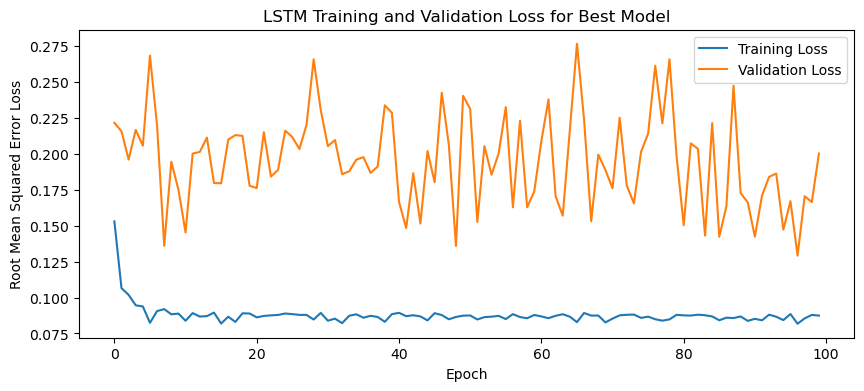

1/1 - 3s - loss: 0.0702 - 3s/epoch - 3s/step
Test Loss: 0.07022341340780258
1/1 [==============================] - 0s 131ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the CNN-LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

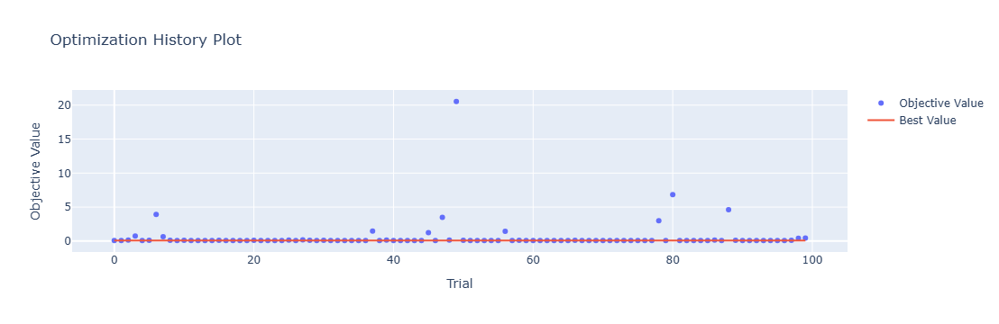

In [4]:
optuna.visualization.plot_optimization_history(study)

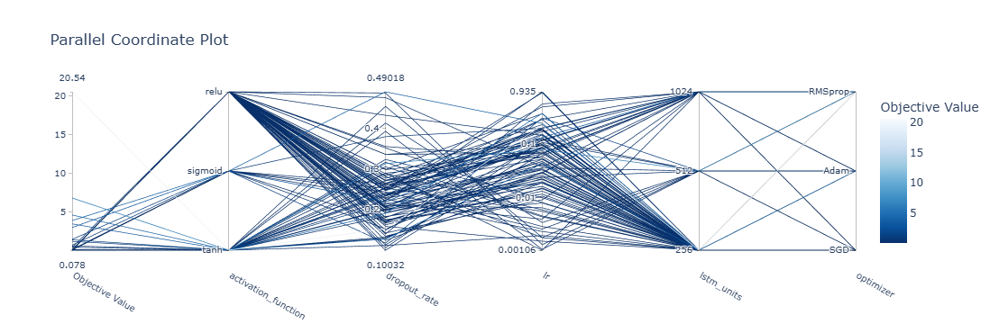

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

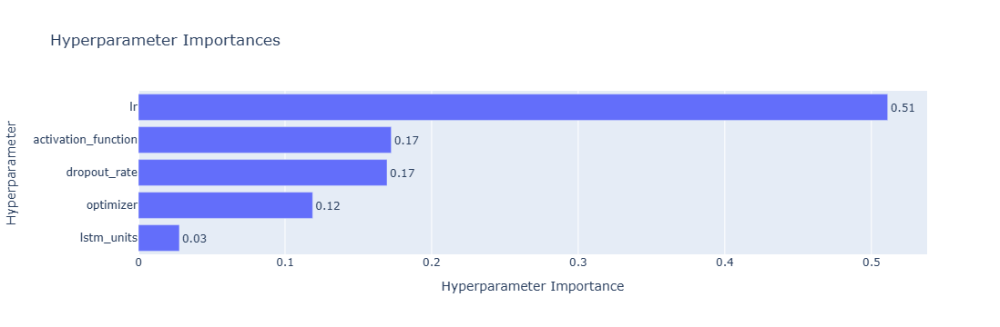

In [6]:
optuna.visualization.plot_param_importances(study)

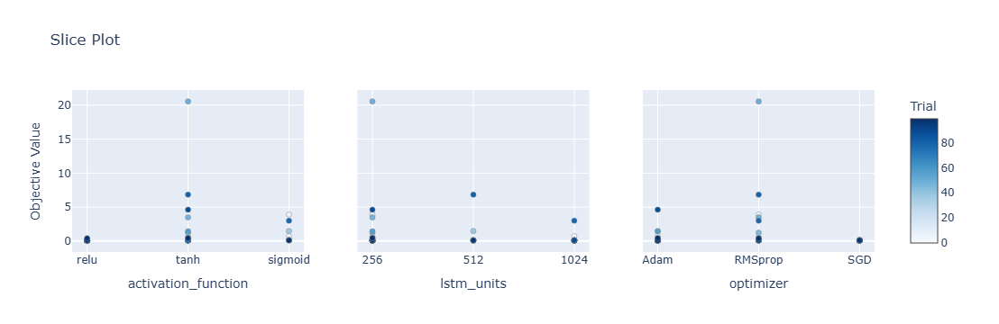

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

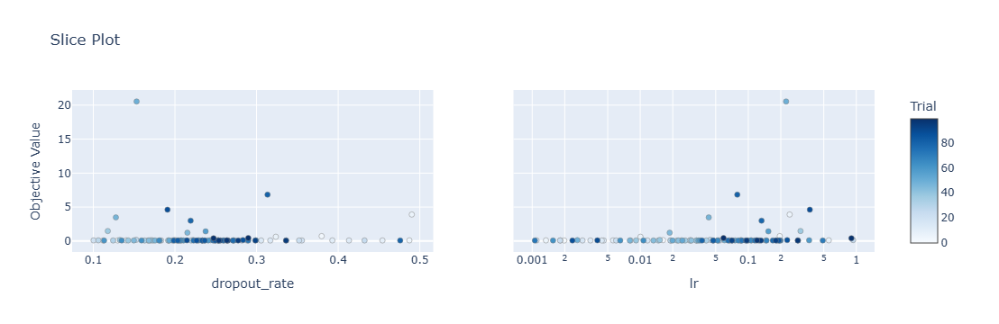

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

Epoch 1/100
84/84 [==============================] - 23s 137ms/step - loss: 0.1533 - accuracy: 0.8452 - mae: 0.1332 - rmse: 0.1533 - mape: 24.5061 - pearson: 0.8112 - val_loss: 0.1385 - val_accuracy: 0.0000e+00 - val_mae: 0.1134 - val_rmse: 0.1385 - val_mape: 24.6824 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 8s 101ms/step - loss: 0.1116 - accuracy: 0.8929 - mae: 0.0947 - rmse: 0.1116 - mape: 17.5193 - pearson: 0.8434 - val_loss: 0.1215 - val_accuracy: 0.0000e+00 - val_mae: 0.0941 - val_rmse: 0.1215 - val_mape: 20.8666 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 7s 81ms/step - loss: 0.0968 - accuracy: 0.8929 - mae: 0.0830 - rmse: 0.0968 - mape: 15.3642 - pearson: 0.8502 - val_loss: 0.2030 - val_accuracy: 0.0000e+00 - val_mae: 0.1500 - val_rmse: 0.2030 - val_mape: 32.6900 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 6s 74ms/step - loss: 0.0913 - accuracy: 0.8810 - mae: 0.0789 - rmse: 0.0913 - mape: 14.59

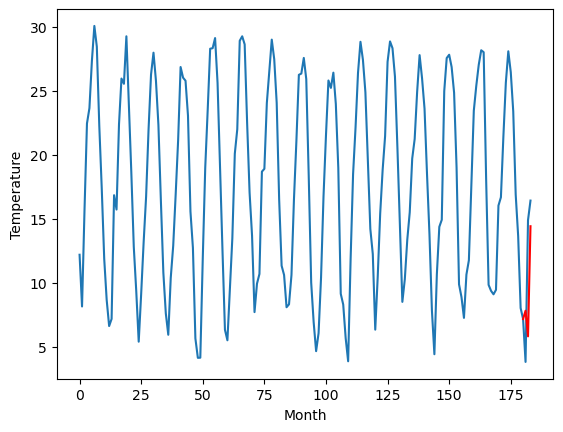

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		6.86		-1.67
8.44		4.86		-3.58
13.50		13.46		-0.04
[180, 181, 182, 183]
[13.23, 6.859424824714661, 4.856508965492249, 13.456702942848207]


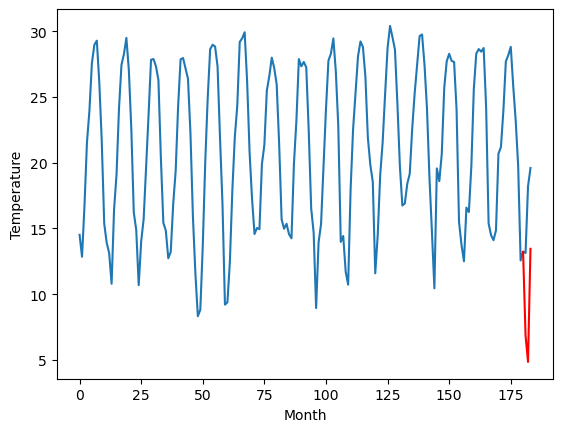

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.31		5.48		-1.83
8.17		3.48		-4.69
14.15		12.08		-2.07
[180, 181, 182, 183]
[7.18, 5.479424824714661, 3.4765089654922487, 12.076702942848206]


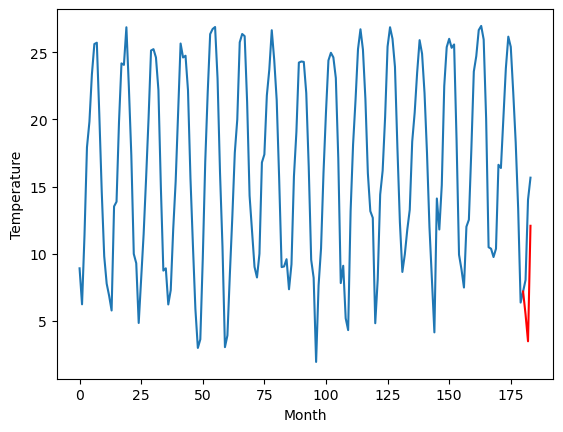

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.38		4.28		-1.10
3.81		2.28		-1.53
11.72		10.88		-0.84
[180, 181, 182, 183]
[11.46, 4.279424824714661, 2.2765089654922486, 10.876702942848205]


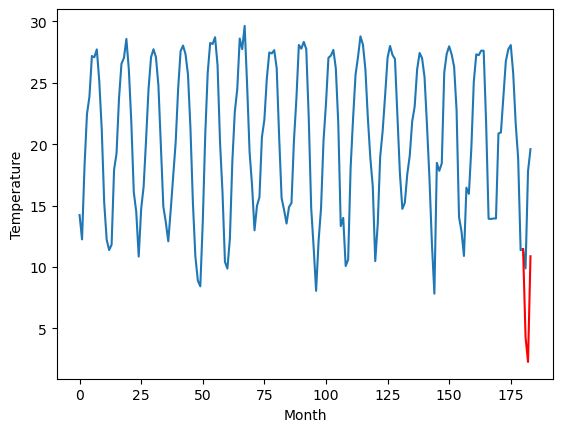

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.33		11.20		-0.13
8.24		9.20		0.96
18.14		17.80		-0.34
[180, 181, 182, 183]
[9.27, 11.199424824714661, 9.19650896549225, 17.796702942848206]


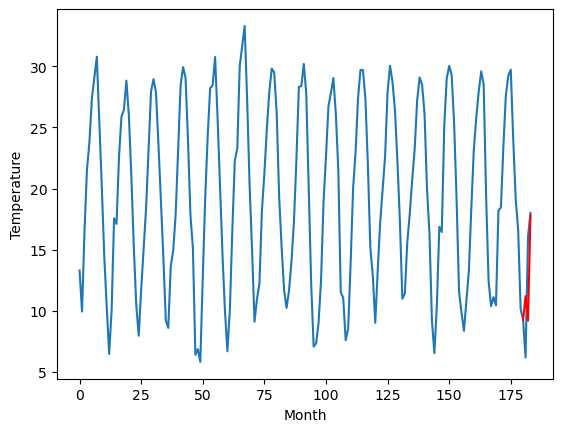

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.74		13.51		0.77
13.39		11.51		-1.88
18.29		20.11		1.82
[180, 181, 182, 183]
[7.77, 13.50942482471466, 11.506508965492248, 20.106702942848205]


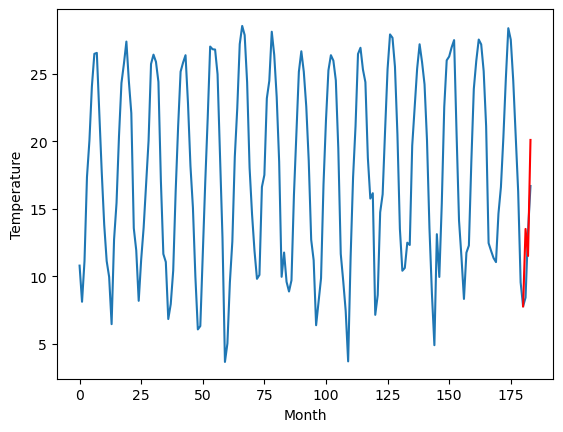

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.33		7.90		-0.43
8.97		5.90		-3.07
15.95		14.50		-1.45
[180, 181, 182, 183]
[6.59, 7.899424824714661, 5.896508965492249, 14.496702942848206]


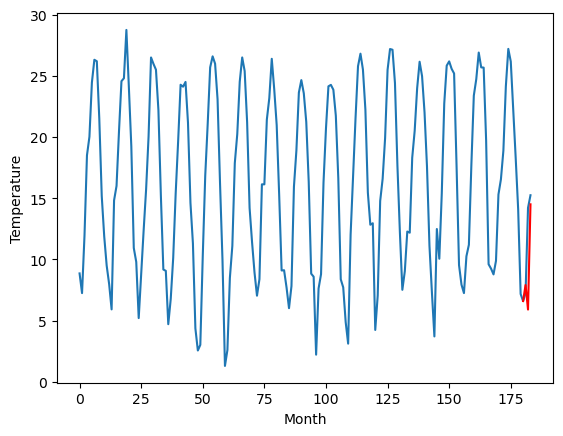

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.29		13.22		-0.07
13.91		11.22		-2.69
20.43		19.82		-0.61
[180, 181, 182, 183]
[5.3, 13.219424824714661, 11.216508965492249, 19.816702942848206]


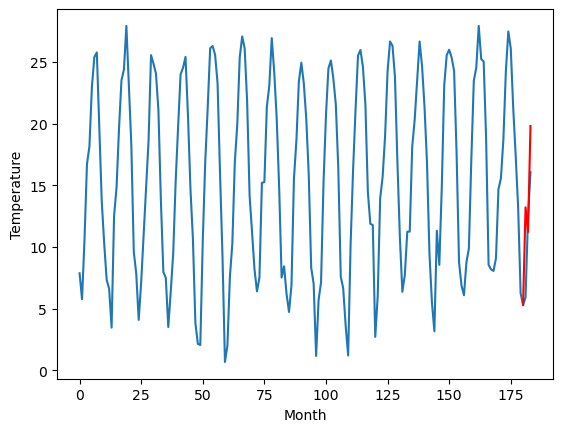

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.51		12.29		-0.22
8.24		10.29		2.05
20.71		18.89		-1.82
[180, 181, 182, 183]
[3.1, 12.289424824714661, 10.28650896549225, 18.886702942848206]


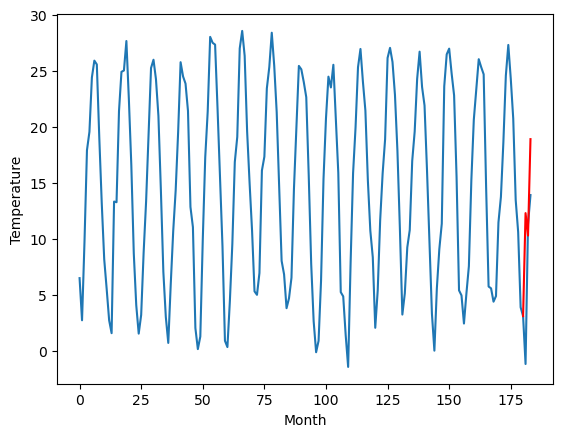

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.20		9.78		0.58
7.03		7.78		0.75
17.78		16.38		-1.40
[180, 181, 182, 183]
[0.6, 9.77942482471466, 7.776508965492248, 16.376702942848205]


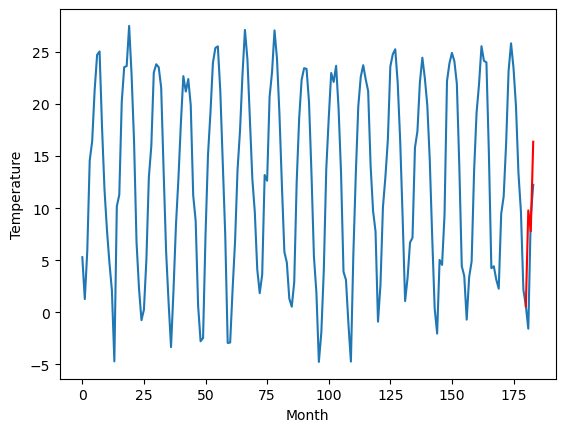

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.24		7.84		0.60
2.93		5.84		2.91
14.66		14.44		-0.22
[180, 181, 182, 183]
[-0.75, 7.83942482471466, 5.836508965492248, 14.436702942848205]


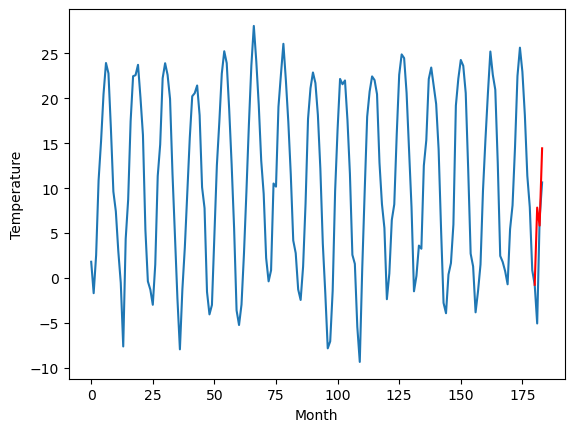

RangeIndex(start=1, stop=12, step=1)
[7.989999999999999, 8.53, 7.310000000000001, 5.3800000000000034, 11.33, 12.739999999999998, 8.33, 13.29, 12.51, 9.2, 7.24]
[7.83942482471466, 6.859424824714661, 5.479424824714661, 4.279424824714661, 11.199424824714661, 13.50942482471466, 7.899424824714661, 13.219424824714661, 12.289424824714661, 9.77942482471466, 7.83942482471466]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.99   7.839425
1                 1    8.53   6.859425
2                 2    7.31   5.479425
3                 3    5.38   4.279425
4                 4   11.33  11.199425
5                 5   12.74  13.509425
6                 6    8.33   7.899425
7                 7   13.29  13.219425
8                 8   12.51  12.289425
9                 9    9.20   9.779425
10               10    7.24   7.839425


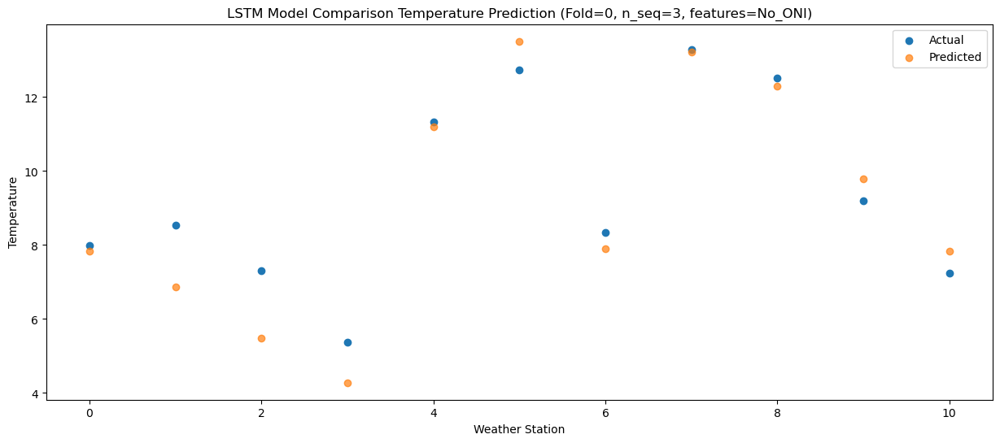

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.64   5.836509
1                 1    8.44   4.856509
2                 2    8.17   3.476509
3                 3    3.81   2.276509
4                 4    8.24   9.196509
5                 5   13.39  11.506509
6                 6    8.97   5.896509
7                 7   13.91  11.216509
8                 8    8.24  10.286509
9                 9    7.03   7.776509
10               10    2.93   5.836509


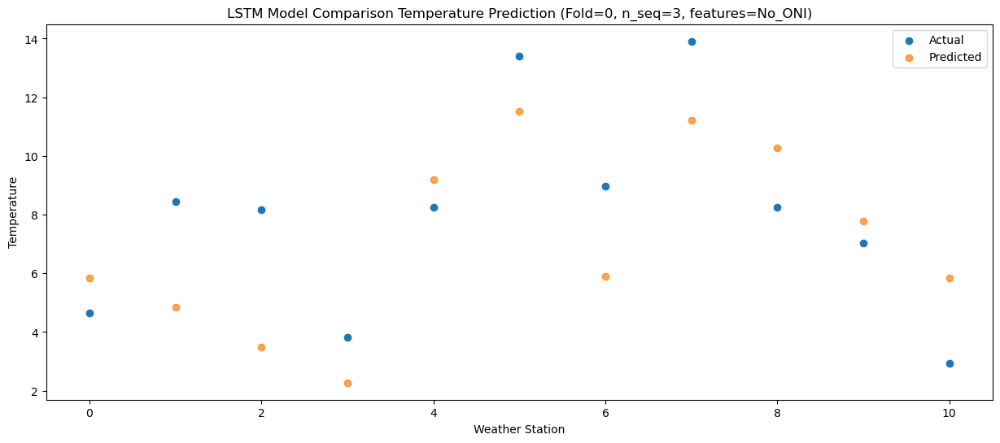

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   15.71  14.436703
1                 1   13.50  13.456703
2                 2   14.15  12.076703
3                 3   11.72  10.876703
4                 4   18.14  17.796703
5                 5   18.29  20.106703
6                 6   15.95  14.496703
7                 7   20.43  19.816703
8                 8   20.71  18.886703
9                 9   17.78  16.376703
10               10   14.66  14.436703


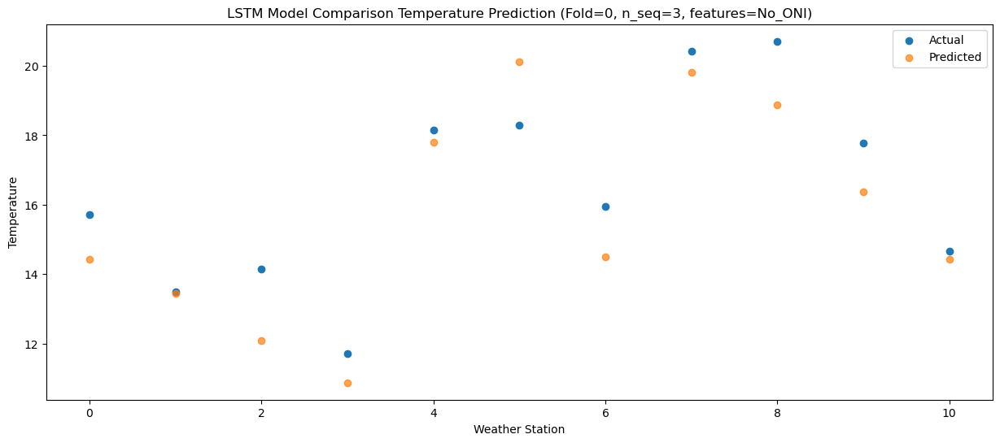

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (1, 1, 1024)              12263424  
                                                                 
 dropout_8 (Dropout)         (1, 1, 1024)              0         
                                                                 
 lstm_9 (LSTM)               (1, 1024)                 8392704   
                                                                 
 dropout_9 (Dropout)         (1, 1024)                 0         
                                                                 
 dense_12 (Dense)            (1, 256)                  262400    
                                                                 
 dense_13 (Dense)            (1, 128)                  32896     
                                                                 
 dense_14 (Dense)            (1, 3)                   

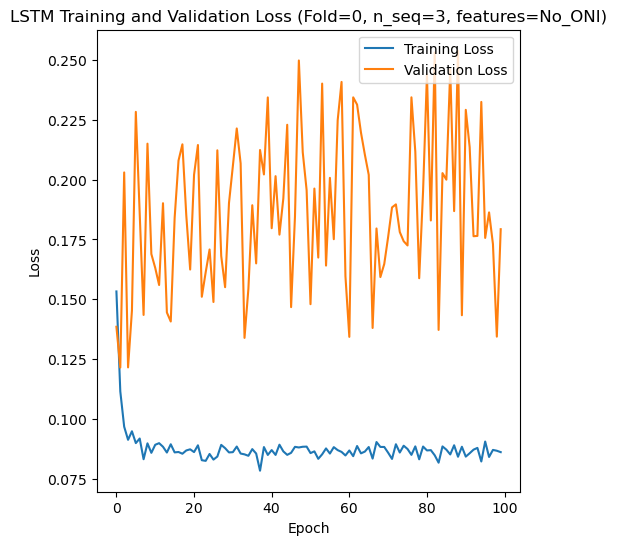

Epoch 1/100
84/84 [==============================] - 24s 140ms/step - loss: 0.1469 - accuracy: 0.7976 - mae: 0.1289 - rmse: 0.1469 - mape: 24.1053 - pearson: 0.7727 - val_loss: 0.2156 - val_accuracy: 0.0000e+00 - val_mae: 0.1462 - val_rmse: 0.2156 - val_mape: 31.0708 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 7s 78ms/step - loss: 0.1096 - accuracy: 0.9048 - mae: 0.0940 - rmse: 0.1096 - mape: 17.4549 - pearson: 0.8505 - val_loss: 0.2579 - val_accuracy: 0.0000e+00 - val_mae: 0.1771 - val_rmse: 0.2579 - val_mape: 37.8351 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 6s 77ms/step - loss: 0.0982 - accuracy: 0.9048 - mae: 0.0838 - rmse: 0.0982 - mape: 15.5313 - pearson: 0.8443 - val_loss: 0.1863 - val_accuracy: 0.0000e+00 - val_mae: 0.1404 - val_rmse: 0.1863 - val_mape: 30.0265 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 7s 83ms/step - loss: 0.0966 - accuracy: 0.9048 - mae: 0.0828 - rmse: 0.0966 - mape: 15.242

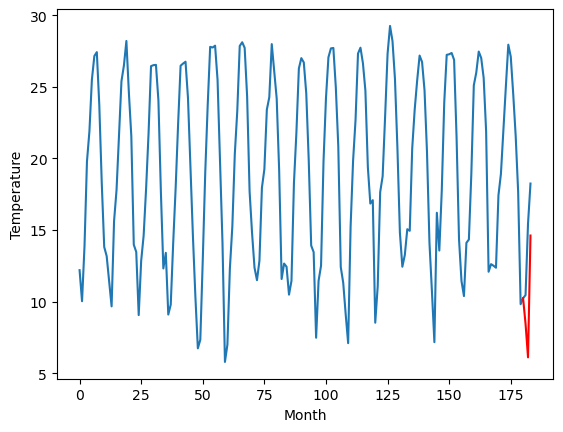

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.49		7.02		-0.47
8.15		4.68		-3.47
14.92		13.19		-1.73
[180, 181, 182, 183]
[6.41, 7.017857375144959, 4.67907220363617, 13.190018477439882]


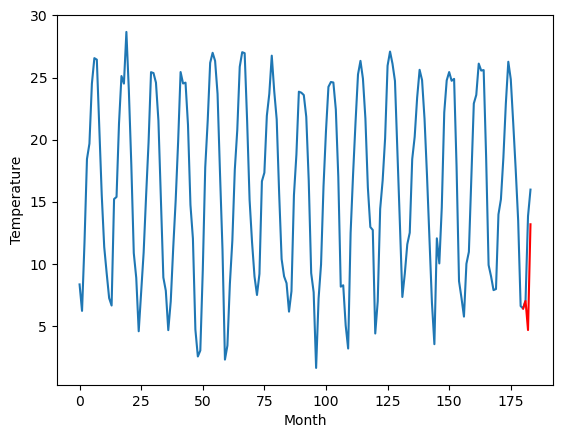

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.35		8.26		-1.09
9.84		5.92		-3.92
16.90		14.43		-2.47
[180, 181, 182, 183]
[7.6, 8.257857375144958, 5.919072203636169, 14.43001847743988]


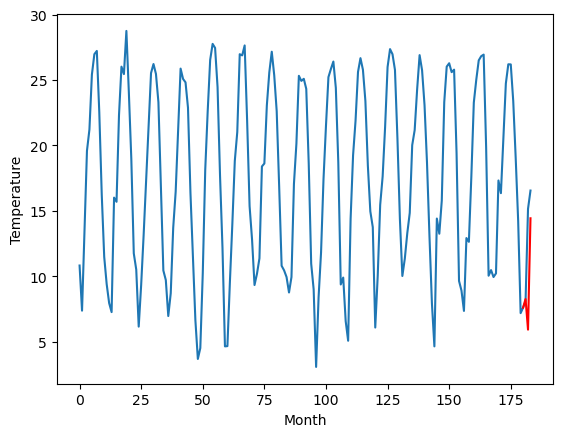

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.86		7.29		-0.57
6.27		4.95		-1.32
13.64		13.46		-0.18
[180, 181, 182, 183]
[11.89, 7.2878573751449585, 4.949072203636169, 13.460018477439881]


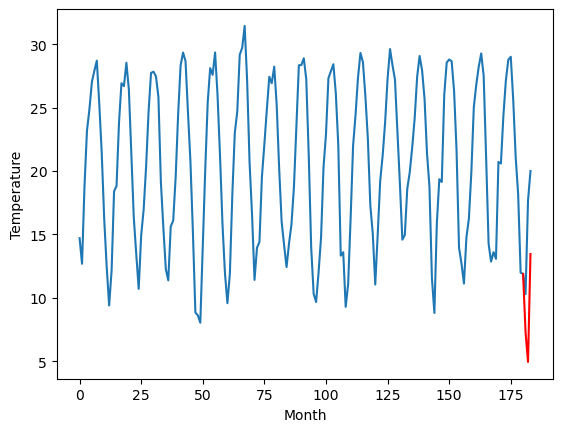

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.19		11.53		-0.66
10.49		9.19		-1.30
18.10		17.70		-0.40
[180, 181, 182, 183]
[10.96, 11.527857375144958, 9.189072203636169, 17.70001847743988]


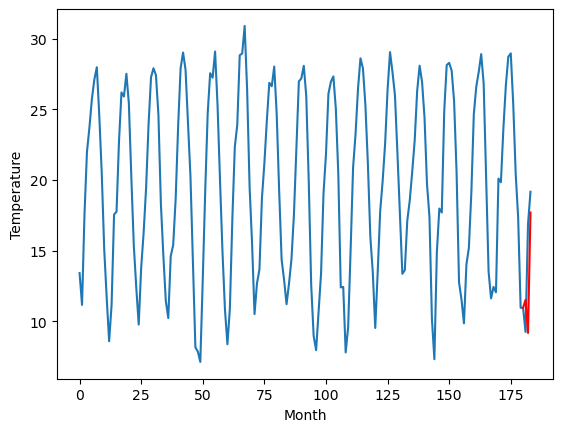

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.84		7.68		0.84
7.22		5.34		-1.88
14.56		13.85		-0.71
[180, 181, 182, 183]
[7.75, 7.677857375144958, 5.339072203636169, 13.85001847743988]


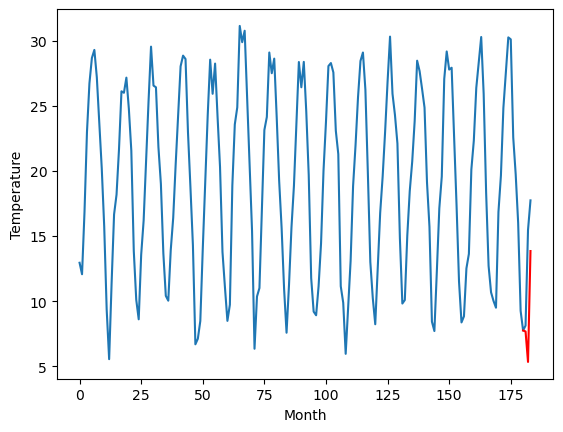

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.62		10.15		-0.47
11.40		7.81		-3.59
17.68		16.32		-1.36
[180, 181, 182, 183]
[6.17, 10.147857375144959, 7.80907220363617, 16.32001847743988]


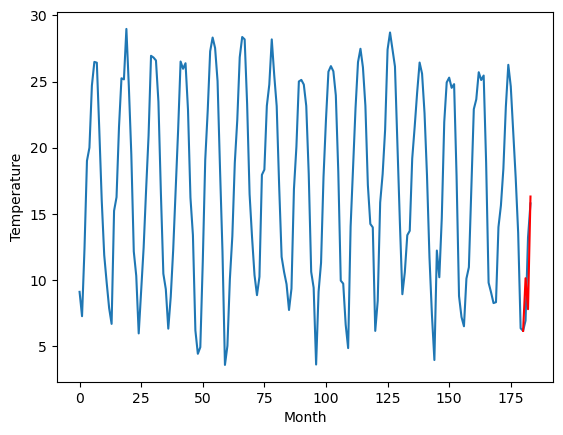

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.40		14.04		-0.36
11.40		11.70		0.30
22.72		20.21		-2.51
[180, 181, 182, 183]
[4.57, 14.03785737514496, 11.69907220363617, 20.21001847743988]


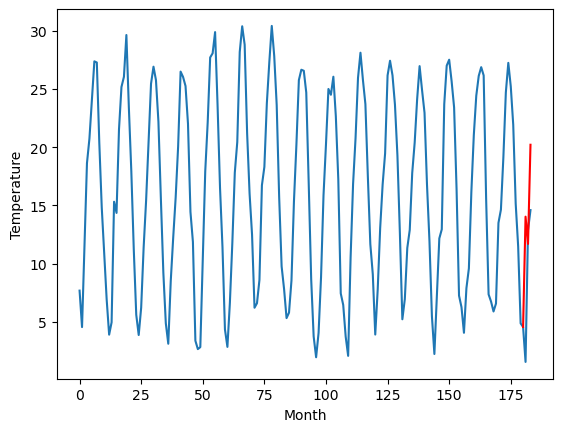

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.07		12.75		-0.32
8.29		10.41		2.12
20.85		18.92		-1.93
[180, 181, 182, 183]
[5.46, 12.747857375144958, 10.40907220363617, 18.920018477439882]


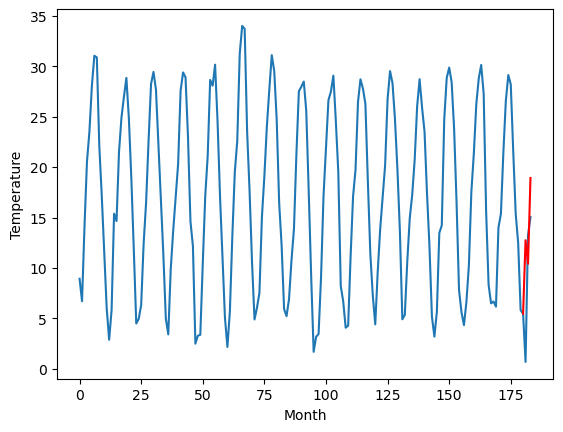

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.06		12.28		-0.78
8.69		9.94		1.25
19.40		18.45		-0.95
[180, 181, 182, 183]
[5.42, 12.277857375144958, 9.939072203636169, 18.45001847743988]


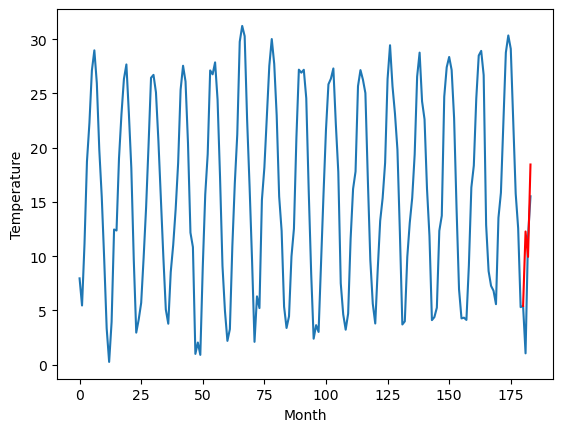

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.28		8.45		1.17
6.32		6.11		-0.21
13.54		14.62		1.08
[180, 181, 182, 183]
[2.17, 8.447857375144958, 6.109072203636169, 14.62001847743988]


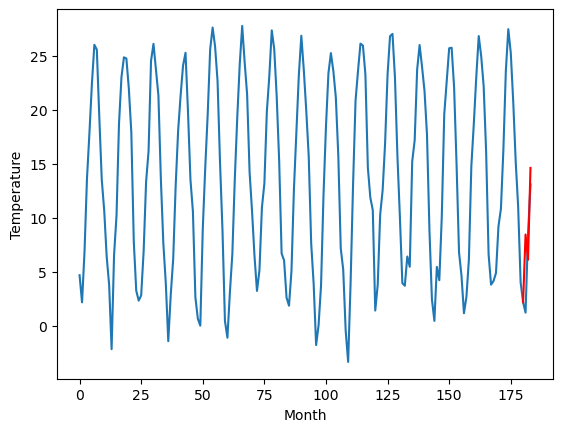

RangeIndex(start=1, stop=12, step=1)
[9.54, 7.489999999999999, 9.35, 7.859999999999999, 12.189999999999998, 6.84, 10.62, 14.4, 13.07, 13.06, 7.279999999999999]
[8.447857375144958, 7.017857375144959, 8.257857375144958, 7.2878573751449585, 11.527857375144958, 7.677857375144958, 10.147857375144959, 14.03785737514496, 12.747857375144958, 12.277857375144958, 8.447857375144958]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    9.54   8.447857
1                 1    7.49   7.017857
2                 2    9.35   8.257857
3                 3    7.86   7.287857
4                 4   12.19  11.527857
5                 5    6.84   7.677857
6                 6   10.62  10.147857
7                 7   14.40  14.037857
8                 8   13.07  12.747857
9                 9   13.06  12.277857
10               10    7.28   8.447857


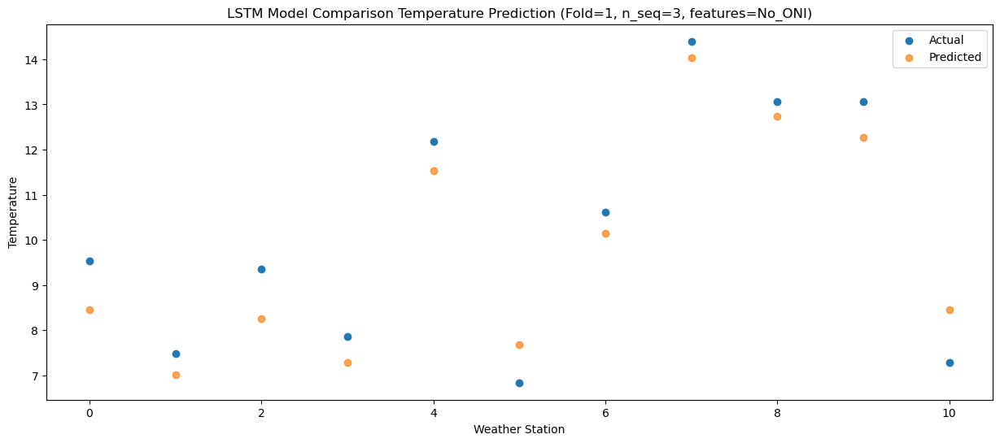

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    9.76   6.109072
1                 1    8.15   4.679072
2                 2    9.84   5.919072
3                 3    6.27   4.949072
4                 4   10.49   9.189072
5                 5    7.22   5.339072
6                 6   11.40   7.809072
7                 7   11.40  11.699072
8                 8    8.29  10.409072
9                 9    8.69   9.939072
10               10    6.32   6.109072


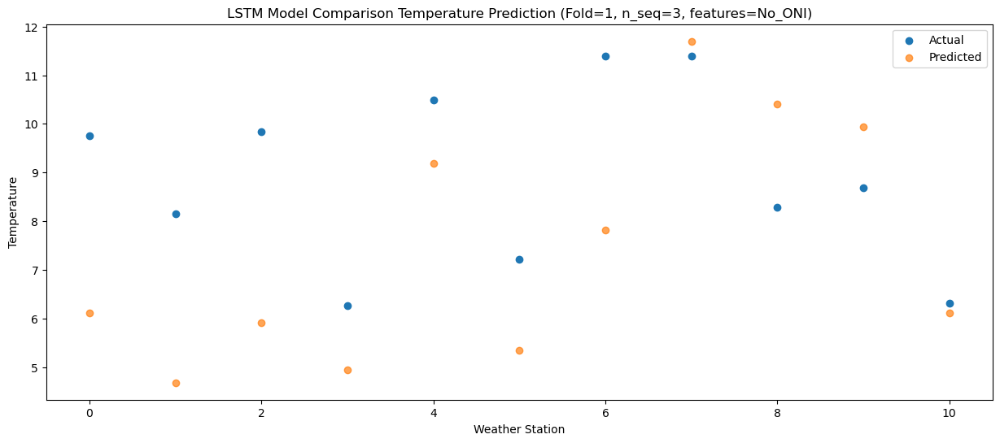

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   14.74  14.620018
1                 1   14.92  13.190018
2                 2   16.90  14.430018
3                 3   13.64  13.460018
4                 4   18.10  17.700018
5                 5   14.56  13.850018
6                 6   17.68  16.320018
7                 7   22.72  20.210018
8                 8   20.85  18.920018
9                 9   19.40  18.450018
10               10   13.54  14.620018


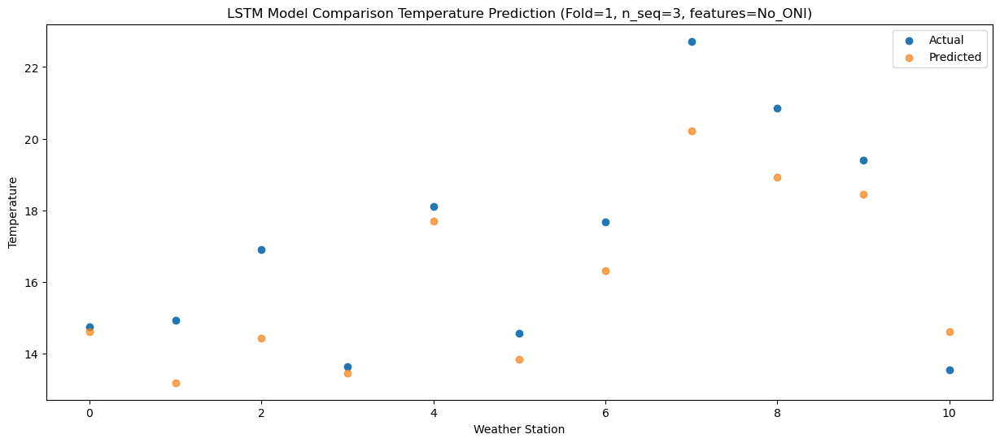

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_10 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_11 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_11 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_15 (Dense)            (1, 256)                  262400    
                                                                 
 dense_16 (Dense)            (1, 128)                  32896     
                                                                 
 dense_17 (Dense)            (1, 3)                   

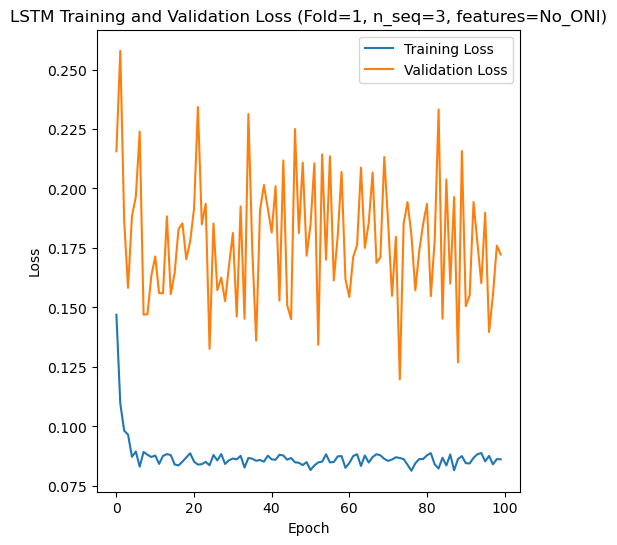

Epoch 1/100
84/84 [==============================] - 23s 156ms/step - loss: 0.1423 - accuracy: 0.8571 - mae: 0.1217 - rmse: 0.1423 - mape: 22.2785 - pearson: 0.8127 - val_loss: 0.2684 - val_accuracy: 0.0000e+00 - val_mae: 0.1779 - val_rmse: 0.2684 - val_mape: 39.9052 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 6s 70ms/step - loss: 0.1069 - accuracy: 0.9167 - mae: 0.0899 - rmse: 0.1069 - mape: 16.8020 - pearson: 0.8739 - val_loss: 0.2011 - val_accuracy: 0.0000e+00 - val_mae: 0.1436 - val_rmse: 0.2011 - val_mape: 32.3141 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 6s 73ms/step - loss: 0.0984 - accuracy: 0.9167 - mae: 0.0843 - rmse: 0.0984 - mape: 15.7601 - pearson: 0.9009 - val_loss: 0.2726 - val_accuracy: 0.0000e+00 - val_mae: 0.2003 - val_rmse: 0.2726 - val_mape: 44.8109 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 6s 70ms/step - loss: 0.0927 - accuracy: 0.9167 - mae: 0.0811 - rmse: 0.0927 - mape: 15.482

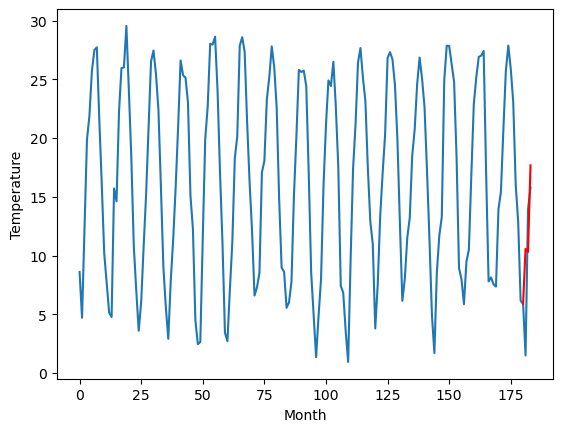

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.69		5.21		-1.48
2.65		4.94		2.29
12.84		12.31		-0.53
[180, 181, 182, 183]
[2.63, 5.205482382774353, 4.944237161874771, 12.314917970895767]


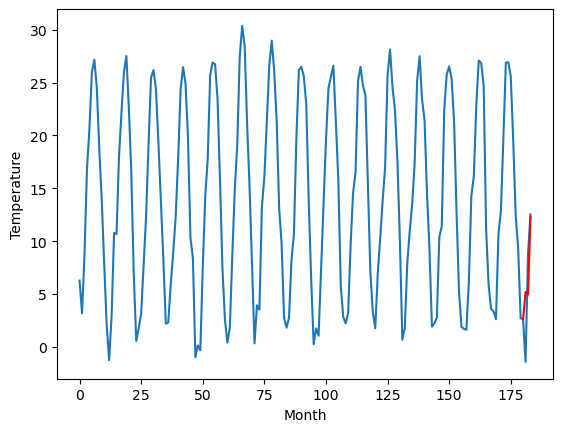

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.70		10.48		-2.22
15.43		10.21		-5.22
17.24		17.58		0.34
[180, 181, 182, 183]
[16.55, 10.475482382774352, 10.21423716187477, 17.584917970895766]


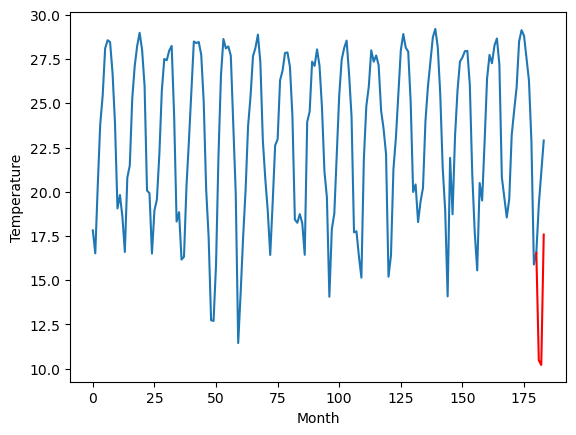

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.49		7.01		1.52
5.51		6.74		1.23
9.62		14.11		4.49
[180, 181, 182, 183]
[-0.83, 7.005482382774353, 6.744237161874771, 14.114917970895767]


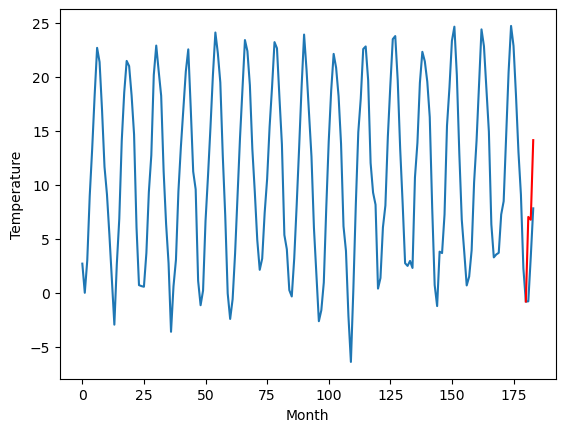

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.96		7.05		-1.91
8.22		6.78		-1.44
15.55		14.15		-1.40
[180, 181, 182, 183]
[11.52, 7.0454823827743525, 6.7842371618747705, 14.154917970895767]


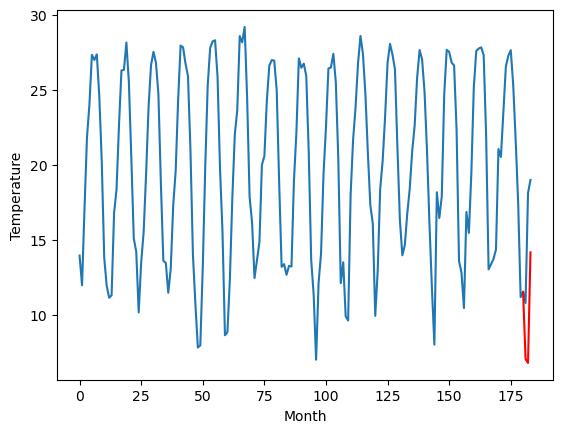

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.69		4.72		-0.97
3.34		4.45		1.11
11.72		11.82		0.10
[180, 181, 182, 183]
[11.47, 4.715482382774353, 4.454237161874771, 11.824917970895768]


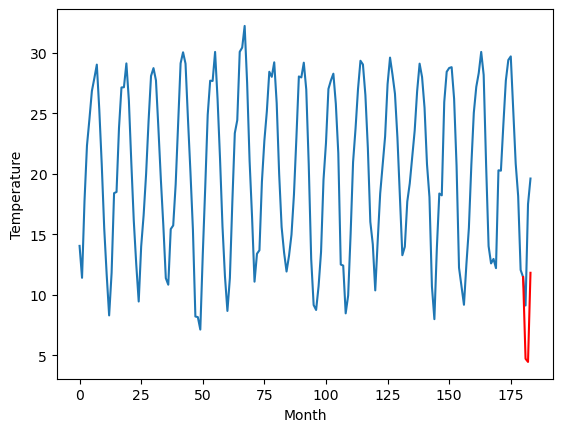

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
17.12		16.26		-0.86
14.01		15.99		1.98
24.38		23.36		-1.02
[180, 181, 182, 183]
[7.75, 16.255482382774353, 15.994237161874771, 23.364917970895767]


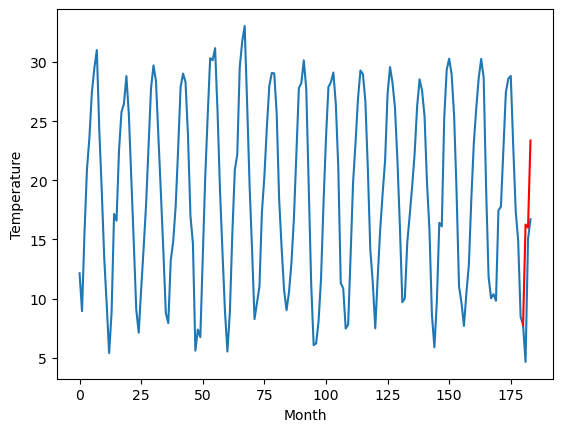

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.22		1.12		-2.10
6.14		0.85		-5.29
9.24		8.22		-1.02
[180, 181, 182, 183]
[4.9, 1.1154823827743532, 0.8542371618747713, 8.224917970895767]


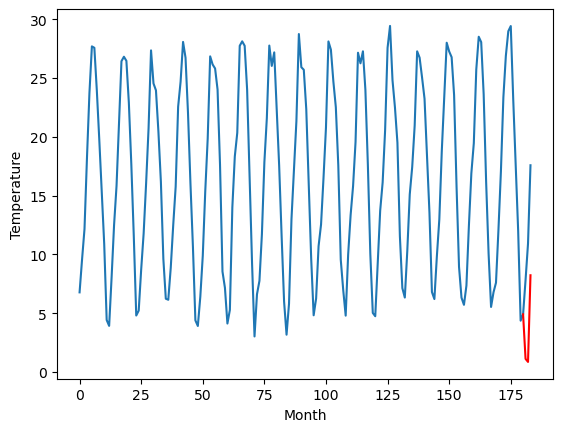

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.88		12.38		-1.50
12.96		12.11		-0.85
12.56		19.48		6.92
[180, 181, 182, 183]
[14.14, 12.375482382774353, 12.11423716187477, 19.484917970895765]


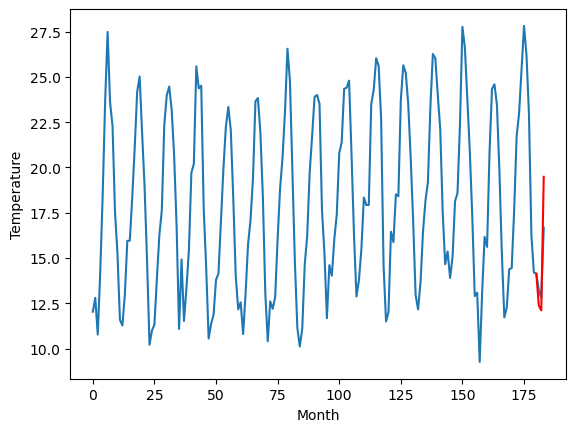

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.64		12.49		-1.15
14.14		12.22		-1.92
21.02		19.59		-1.43
[180, 181, 182, 183]
[5.55, 12.485482382774354, 12.224237161874772, 19.594917970895768]


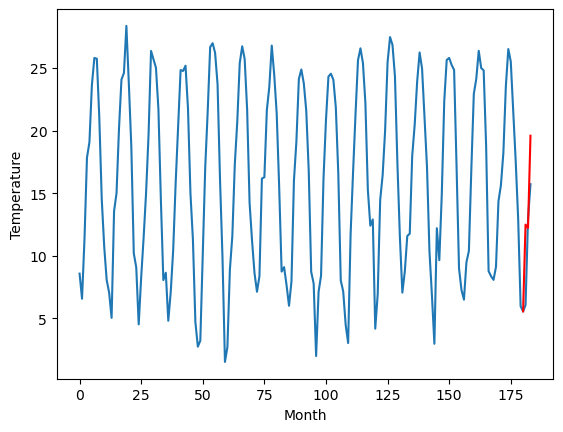

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.47		10.58		-1.89
13.82		10.31		-3.51
20.03		17.68		-2.35
[180, 181, 182, 183]
[3.19, 10.575482382774354, 10.314237161874772, 17.684917970895768]


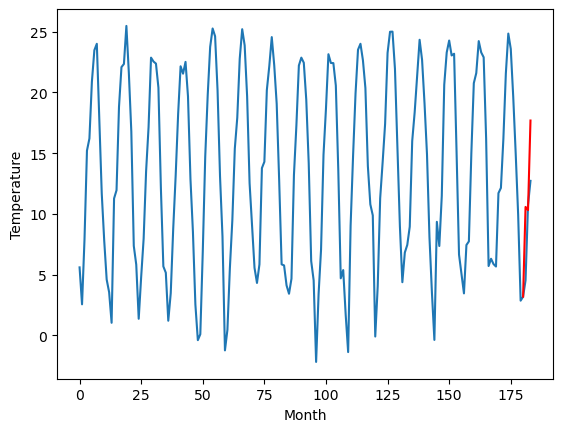

RangeIndex(start=1, stop=12, step=1)
[11.88, 6.69, 12.7, 5.490000000000001, 8.96, 5.69, 17.12, 3.2200000000000015, 13.880000000000003, 13.64, 12.47]
[10.575482382774354, 5.205482382774353, 10.475482382774352, 7.005482382774353, 7.0454823827743525, 4.715482382774353, 16.255482382774353, 1.1154823827743532, 12.375482382774353, 12.485482382774354, 10.575482382774354]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   11.88  10.575482
1                 1    6.69   5.205482
2                 2   12.70  10.475482
3                 3    5.49   7.005482
4                 4    8.96   7.045482
5                 5    5.69   4.715482
6                 6   17.12  16.255482
7                 7    3.22   1.115482
8                 8   13.88  12.375482
9                 9   13.64  12.485482
10               10   12.47  10.575482


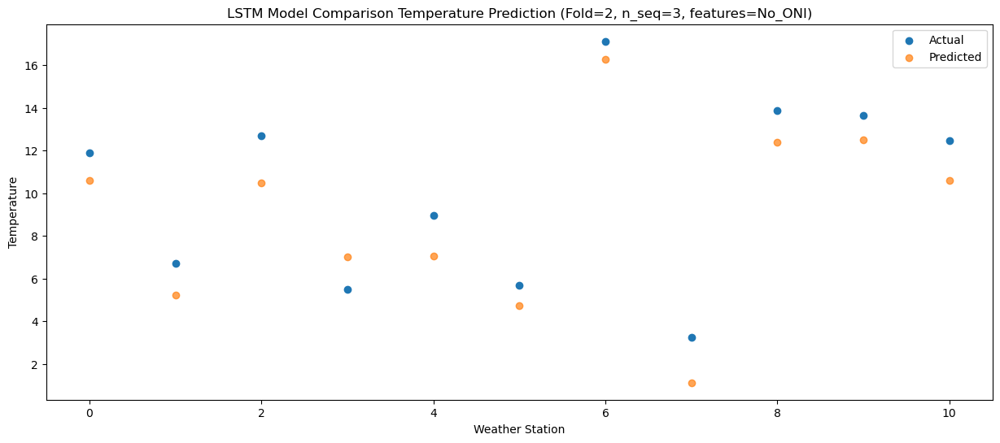

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    7.48  10.314237
1                 1    2.65   4.944237
2                 2   15.43  10.214237
3                 3    5.51   6.744237
4                 4    8.22   6.784237
5                 5    3.34   4.454237
6                 6   14.01  15.994237
7                 7    6.14   0.854237
8                 8   12.96  12.114237
9                 9   14.14  12.224237
10               10   13.82  10.314237


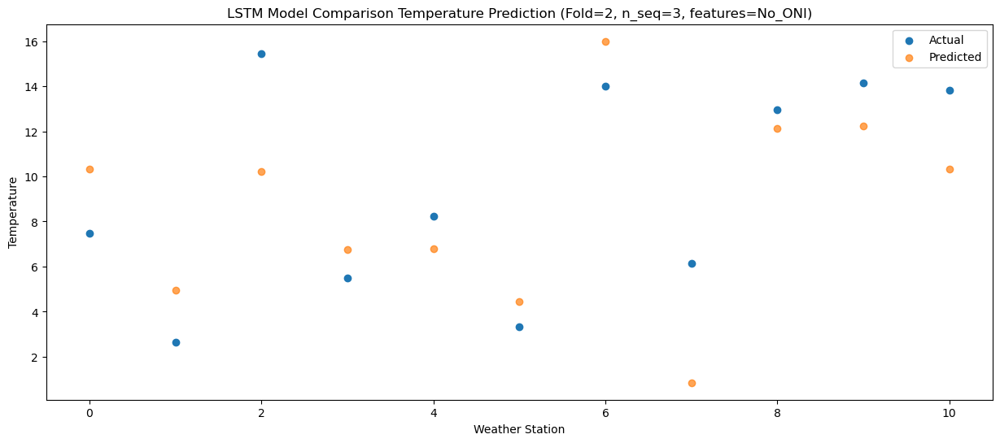

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   19.90  17.684918
1                 1   12.84  12.314918
2                 2   17.24  17.584918
3                 3    9.62  14.114918
4                 4   15.55  14.154918
5                 5   11.72  11.824918
6                 6   24.38  23.364918
7                 7    9.24   8.224918
8                 8   12.56  19.484918
9                 9   21.02  19.594918
10               10   20.03  17.684918


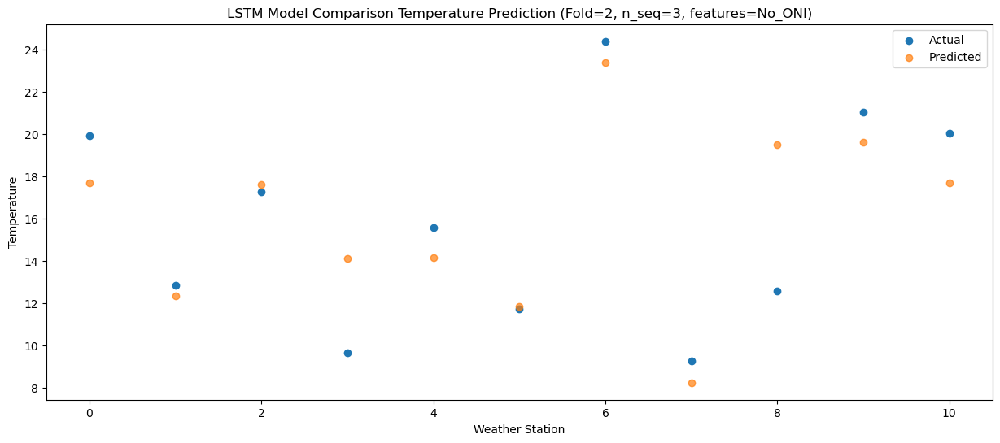

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_12 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_13 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_13 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_18 (Dense)            (1, 256)                  262400    
                                                                 
 dense_19 (Dense)            (1, 128)                  32896     
                                                                 
 dense_20 (Dense)            (1, 3)                   

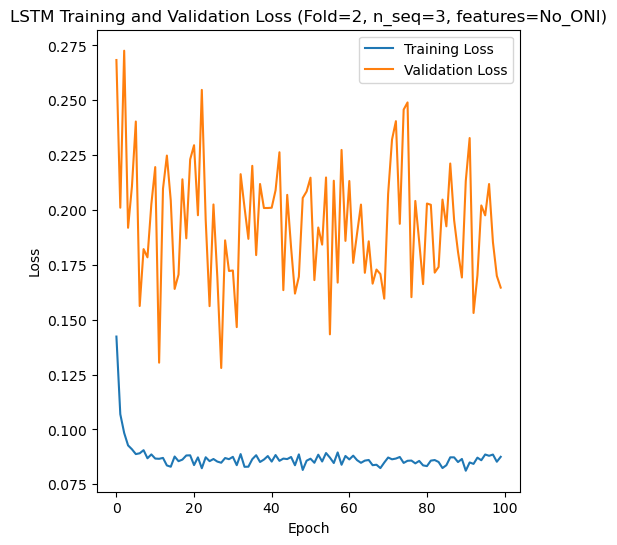

Epoch 1/100
84/84 [==============================] - 24s 133ms/step - loss: 0.1472 - accuracy: 0.9048 - mae: 0.1288 - rmse: 0.1472 - mape: 24.6045 - pearson: 0.8000 - val_loss: 0.1836 - val_accuracy: 0.0000e+00 - val_mae: 0.1520 - val_rmse: 0.1836 - val_mape: 34.4228 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 6s 73ms/step - loss: 0.1014 - accuracy: 0.9524 - mae: 0.0872 - rmse: 0.1014 - mape: 16.9603 - pearson: 0.8784 - val_loss: 0.1746 - val_accuracy: 0.0000e+00 - val_mae: 0.1259 - val_rmse: 0.1746 - val_mape: 27.8141 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 6s 69ms/step - loss: 0.0979 - accuracy: 0.9524 - mae: 0.0867 - rmse: 0.0979 - mape: 16.6807 - pearson: 0.8753 - val_loss: 0.2663 - val_accuracy: 0.0000e+00 - val_mae: 0.1887 - val_rmse: 0.2663 - val_mape: 42.2301 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 6s 73ms/step - loss: 0.0920 - accuracy: 0.9524 - mae: 0.0800 - rmse: 0.0920 - mape: 15.550

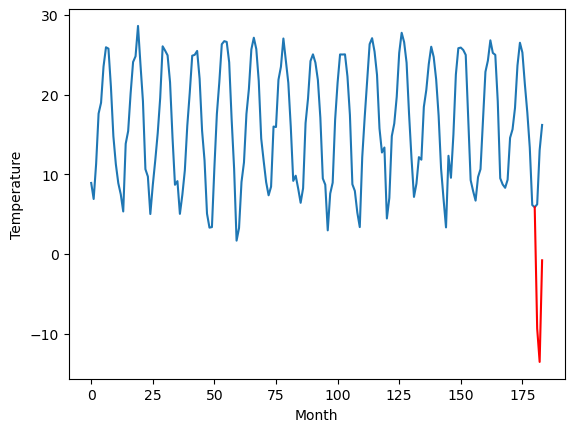

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.42		8.44		0.02
4.70		4.25		-0.45
16.67		17.00		0.33
[180, 181, 182, 183]
[3.2, 8.441181964874268, 4.245544261932373, 17.000058002471924]


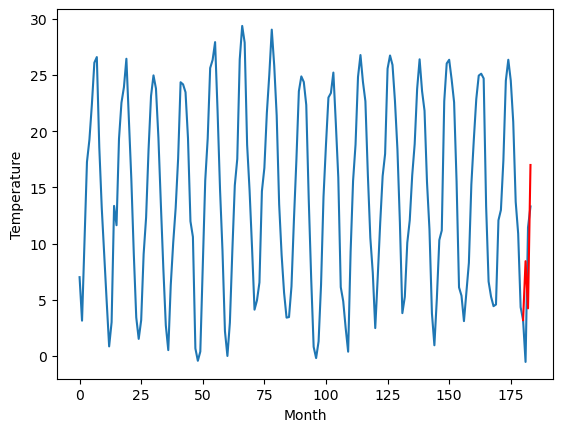

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.30		7.91		-2.39
12.60		3.72		-8.88
13.75		16.47		2.72
[180, 181, 182, 183]
[8.48, 7.911181964874267, 3.715544261932372, 16.470058002471923]


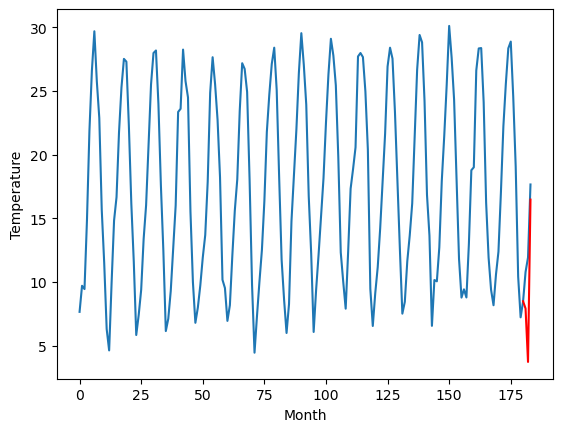

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.74		2.07		0.33
0.42		-2.12		-2.54
10.63		10.63		0.00
[180, 181, 182, 183]
[1.55, 2.0711819648742678, -2.1244557380676268, 10.630058002471923]


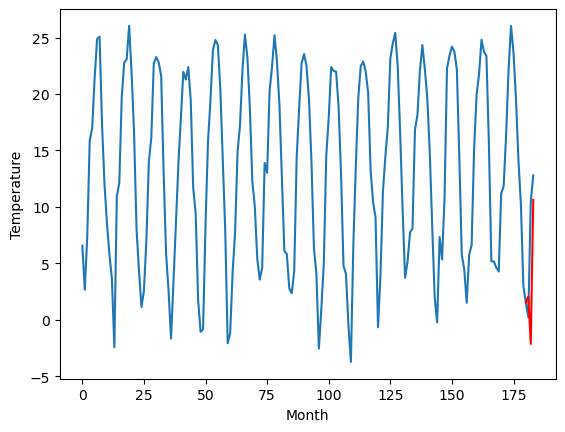

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.43		7.77		0.34
3.56		3.58		0.02
16.64		16.33		-0.31
[180, 181, 182, 183]
[1.08, 7.771181964874268, 3.5755442619323734, 16.330058002471922]


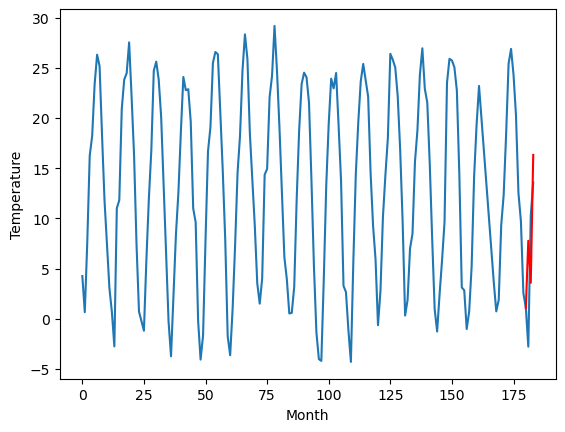

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.57		5.89		0.32
2.85		1.70		-1.15
14.18		14.45		0.27
[180, 181, 182, 183]
[0.21, 5.891181964874267, 1.6955442619323726, 14.450058002471923]


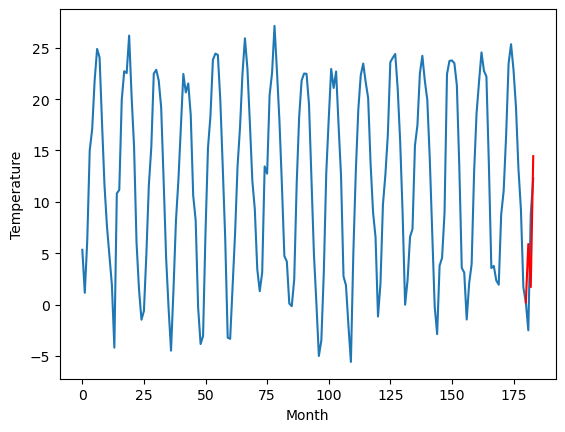

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.92		6.52		-1.40
8.02		2.33		-5.69
10.99		15.08		4.09
[180, 181, 182, 183]
[-8.22, 6.521181964874268, 2.3255442619323734, 15.080058002471924]


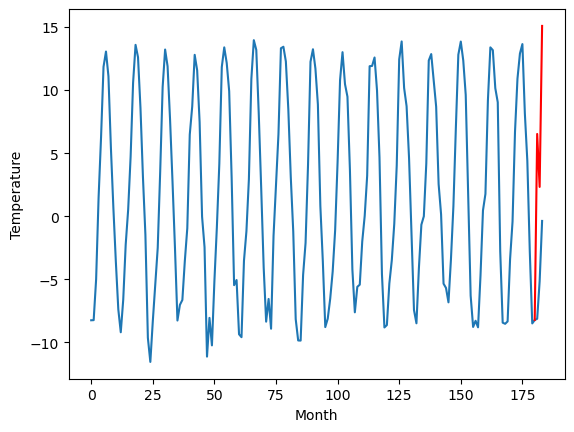

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.12		5.44		-1.68
9.97		1.25		-8.72
11.57		14.00		2.43
[180, 181, 182, 183]
[10.04, 5.441181964874268, 1.2455442619323733, 14.000058002471924]


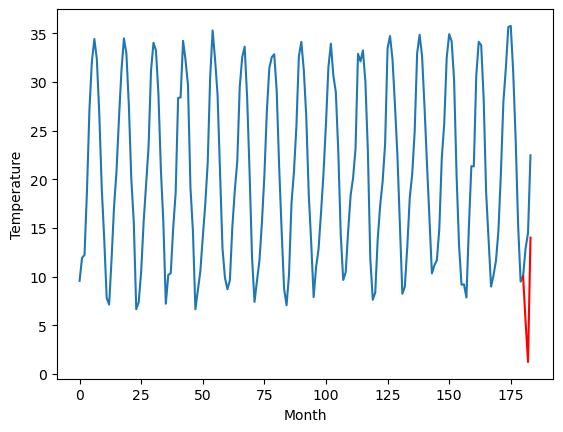

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.47		3.12		-2.35
6.40		-1.07		-7.47
6.18		11.68		5.50
[180, 181, 182, 183]
[9.17, 3.1211819648742676, -1.074455738067627, 11.680058002471924]


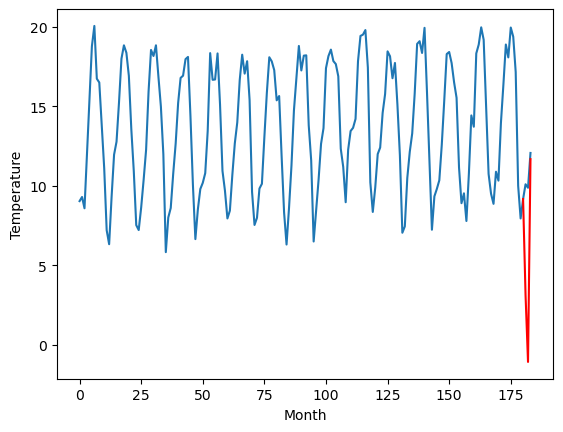

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.31		4.20		1.89
2.19		0.01		-2.18
7.19		12.76		5.57
[180, 181, 182, 183]
[0.94, 4.201181964874268, 0.005544261932373118, 12.760058002471924]


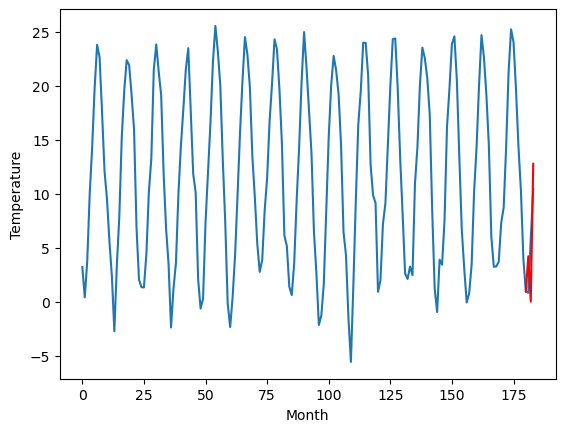

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-9.80		-9.37		0.43
-10.60		-13.56		-2.96
-3.41		-0.81		2.60
[180, 181, 182, 183]
[-0.13, -9.368818035125733, -13.564455738067627, -0.8099419975280764]


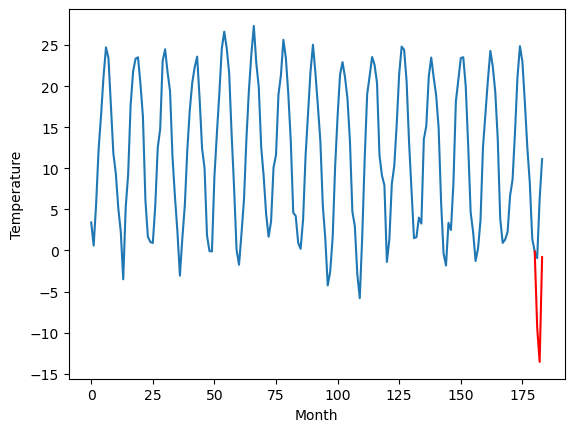

RangeIndex(start=1, stop=12, step=1)
[-8.520000000000001, 8.420000000000002, 10.299999999999999, 1.7399999999999998, 7.430000000000001, 5.5699999999999985, 7.92, 7.119999999999999, 5.4700000000000015, 2.3099999999999996, -9.8]
[-9.368818035125733, 8.441181964874268, 7.911181964874267, 2.0711819648742678, 7.771181964874268, 5.891181964874267, 6.521181964874268, 5.441181964874268, 3.1211819648742676, 4.201181964874268, -9.368818035125733]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0   -8.52  -9.368818
1                 1    8.42   8.441182
2                 2   10.30   7.911182
3                 3    1.74   2.071182
4                 4    7.43   7.771182
5                 5    5.57   5.891182
6                 6    7.92   6.521182
7                 7    7.12   5.441182
8                 8    5.47   3.121182
9                 9    2.31   4.201182
10               10   -9.80  -9.368818


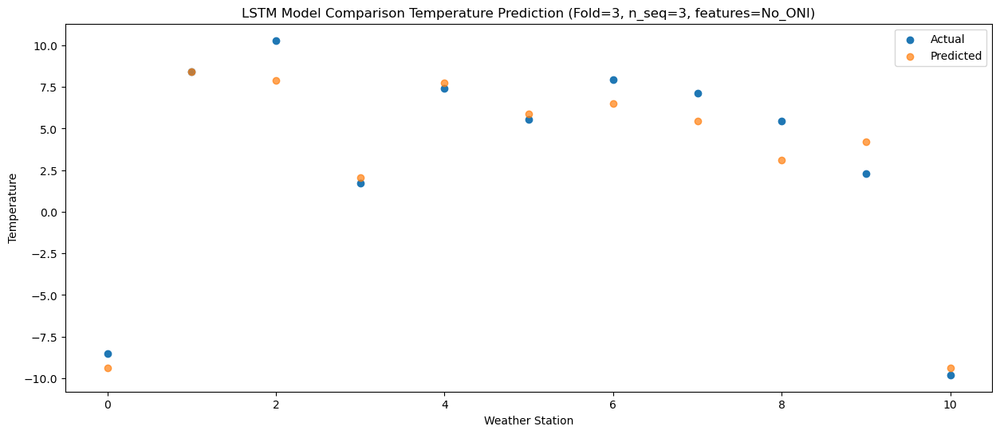

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -8.15 -13.564456
1                 1    4.70   4.245544
2                 2   12.60   3.715544
3                 3    0.42  -2.124456
4                 4    3.56   3.575544
5                 5    2.85   1.695544
6                 6    8.02   2.325544
7                 7    9.97   1.245544
8                 8    6.40  -1.074456
9                 9    2.19   0.005544
10               10  -10.60 -13.564456


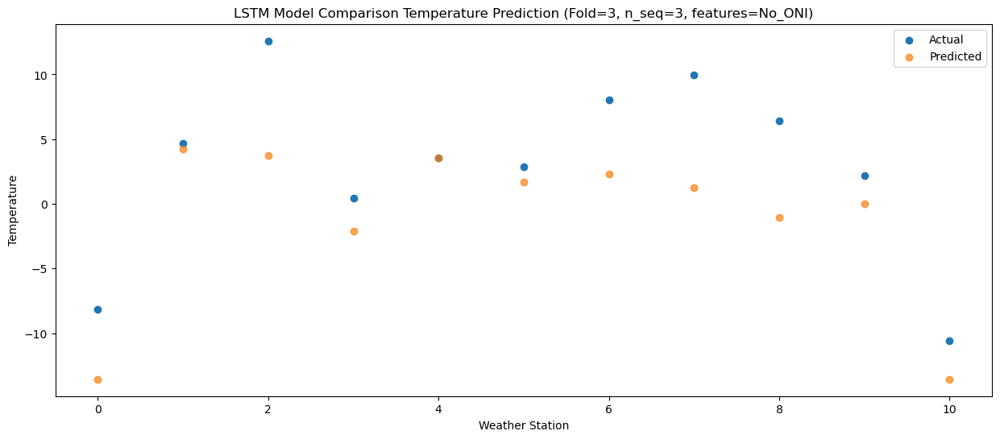

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   -1.35  -0.809942
1                 1   16.67  17.000058
2                 2   13.75  16.470058
3                 3   10.63  10.630058
4                 4   16.64  16.330058
5                 5   14.18  14.450058
6                 6   10.99  15.080058
7                 7   11.57  14.000058
8                 8    6.18  11.680058
9                 9    7.19  12.760058
10               10   -3.41  -0.809942


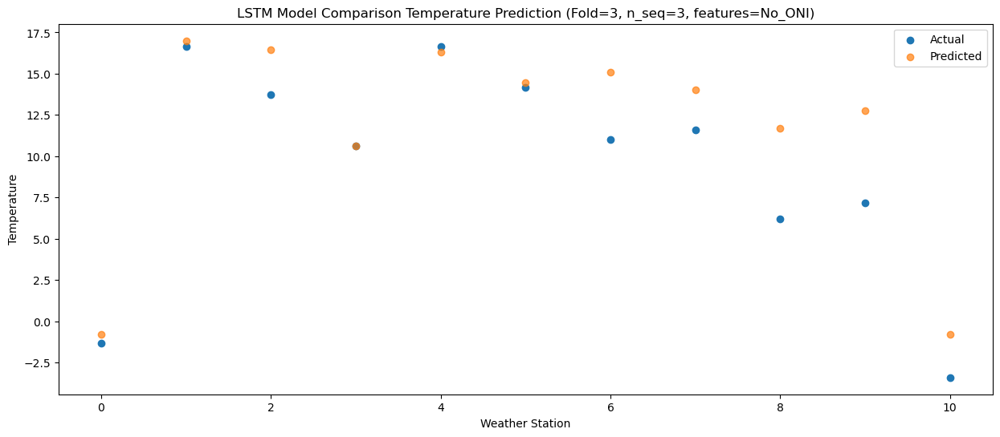

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_14 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_14 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_15 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_15 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_21 (Dense)            (1, 256)                  262400    
                                                                 
 dense_22 (Dense)            (1, 128)                  32896     
                                                                 
 dense_23 (Dense)            (1, 3)                   

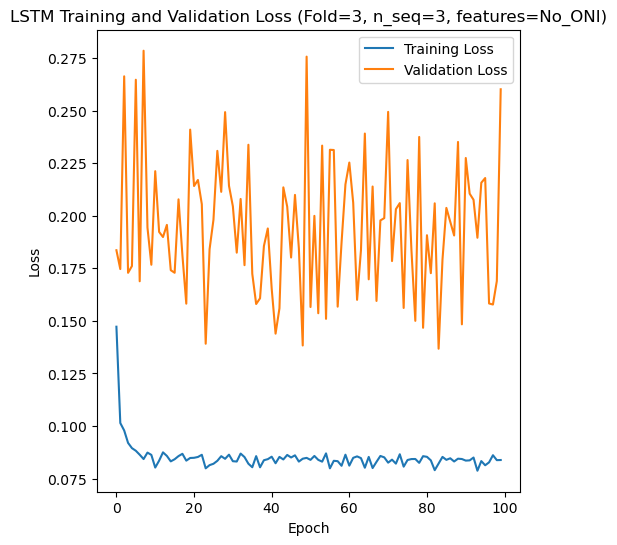

Epoch 1/100
84/84 [==============================] - 26s 132ms/step - loss: 0.1424 - accuracy: 0.8214 - mae: 0.1247 - rmse: 0.1424 - mape: 22.8080 - pearson: 0.8100 - val_loss: 0.1366 - val_accuracy: 0.0000e+00 - val_mae: 0.1064 - val_rmse: 0.1366 - val_mape: 23.5072 - val_pearson: nan
Epoch 2/100
84/84 [==============================] - 6s 76ms/step - loss: 0.1038 - accuracy: 0.9048 - mae: 0.0877 - rmse: 0.1038 - mape: 16.1004 - pearson: 0.8422 - val_loss: 0.1454 - val_accuracy: 0.0000e+00 - val_mae: 0.1120 - val_rmse: 0.1454 - val_mape: 24.9999 - val_pearson: nan
Epoch 3/100
84/84 [==============================] - 6s 71ms/step - loss: 0.0928 - accuracy: 0.9048 - mae: 0.0787 - rmse: 0.0928 - mape: 14.4404 - pearson: 0.8628 - val_loss: 0.1516 - val_accuracy: 0.0000e+00 - val_mae: 0.1158 - val_rmse: 0.1516 - val_mape: 25.7023 - val_pearson: nan
Epoch 4/100
84/84 [==============================] - 6s 74ms/step - loss: 0.0904 - accuracy: 0.9048 - mae: 0.0788 - rmse: 0.0904 - mape: 14.839

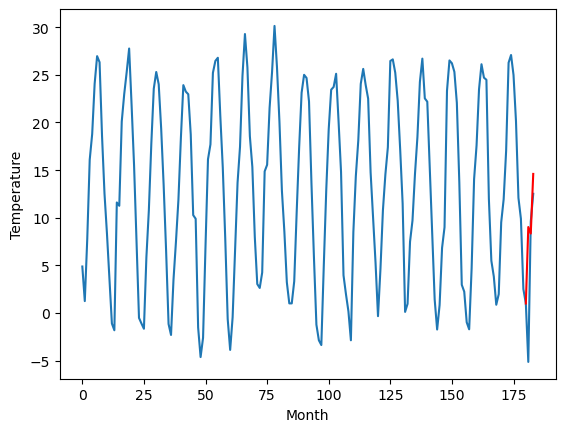

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.34		7.35		-0.99
11.77		6.67		-5.10
13.37		12.92		-0.45
[180, 181, 182, 183]
[14.25, 7.354990764856338, 6.666942819356918, 12.923910840749741]


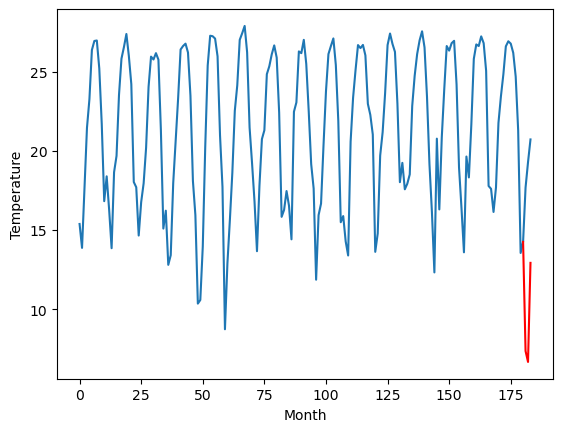

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		3.97		-0.32
2.37		3.29		0.92
11.70		9.54		-2.16
[180, 181, 182, 183]
[9.06, 3.9749907648563383, 3.286942819356918, 9.54391084074974]


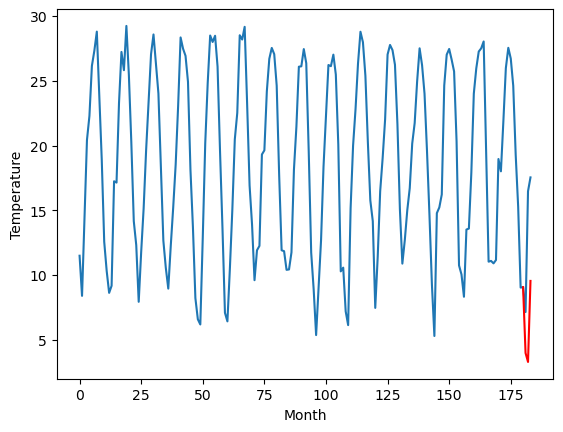

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.70		3.33		0.63
-0.76		2.65		3.41
10.20		8.90		-1.30
[180, 181, 182, 183]
[7.48, 3.3349907648563386, 2.6469428193569184, 8.903910840749742]


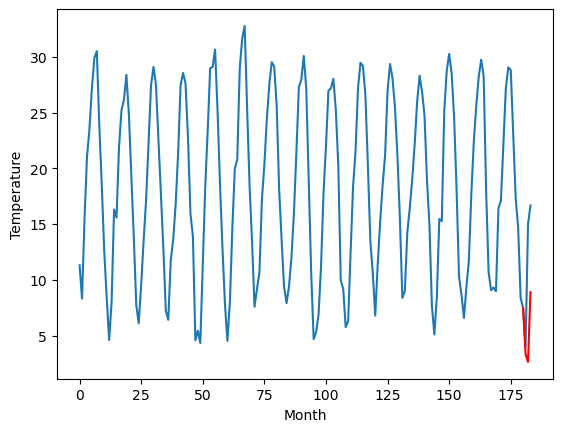

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.29		4.60		0.31
0.40		3.92		3.52
11.32		10.17		-1.15
[180, 181, 182, 183]
[7.33, 4.604990764856338, 3.916942819356918, 10.173910840749741]


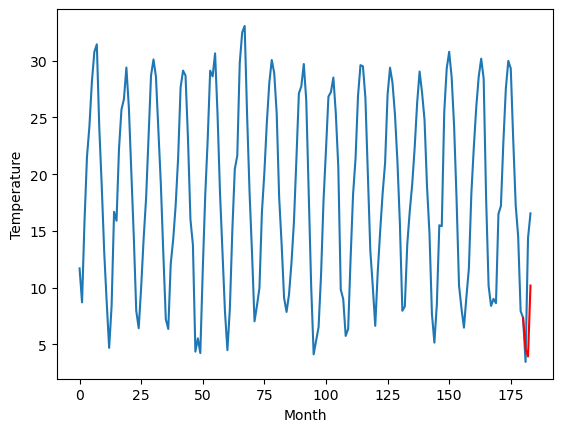

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.28		15.09		0.81
12.71		14.41		1.70
21.96		20.66		-1.30
[180, 181, 182, 183]
[6.59, 15.09499076485634, 14.40694281935692, 20.663910840749743]


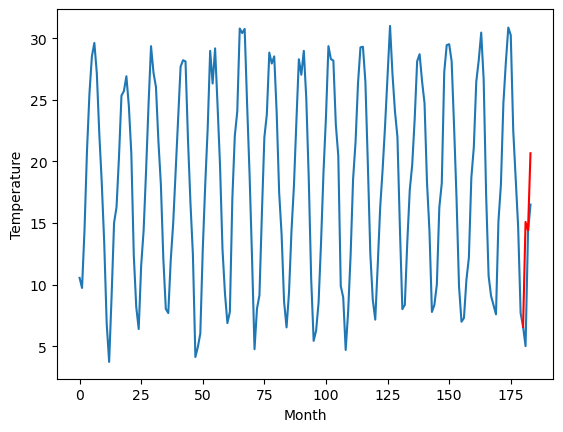

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.72		11.20		-0.52
12.39		10.52		-1.87
18.79		16.77		-2.02
[180, 181, 182, 183]
[6.04, 11.204990764856339, 10.516942819356919, 16.773910840749743]


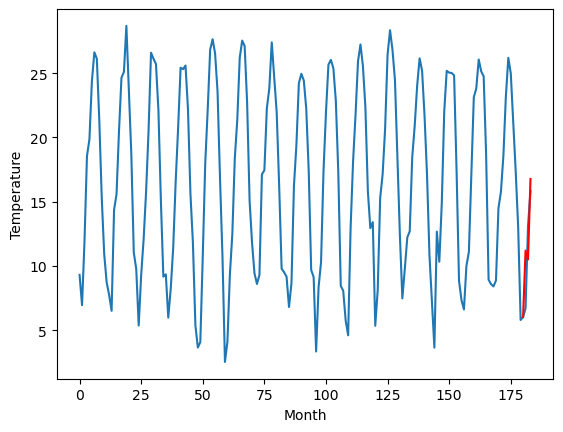

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.64		11.02		1.38
6.03		10.34		4.31
18.30		16.59		-1.71
[180, 181, 182, 183]
[3.13, 11.024990764856339, 10.336942819356919, 16.593910840749743]


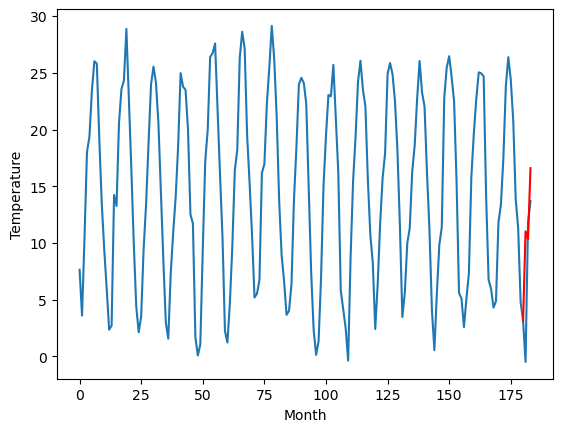

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.11		11.40		1.29
6.75		10.72		3.97
18.72		16.97		-1.75
[180, 181, 182, 183]
[-0.29, 11.404990764856338, 10.716942819356918, 16.97391084074974]


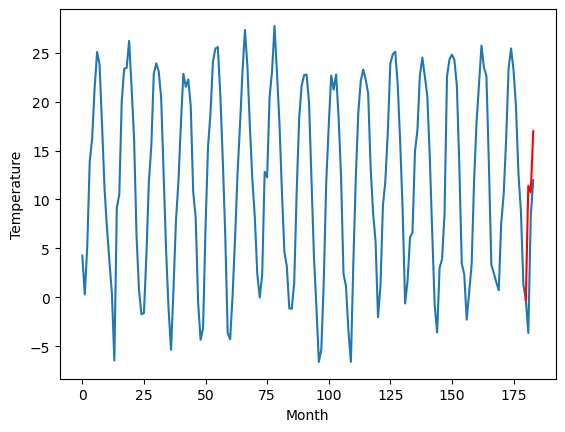

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		10.27		1.74
4.09		9.59		5.50
17.95		15.84		-2.11
[180, 181, 182, 183]
[-1.03, 10.274990764856339, 9.586942819356919, 15.843910840749741]


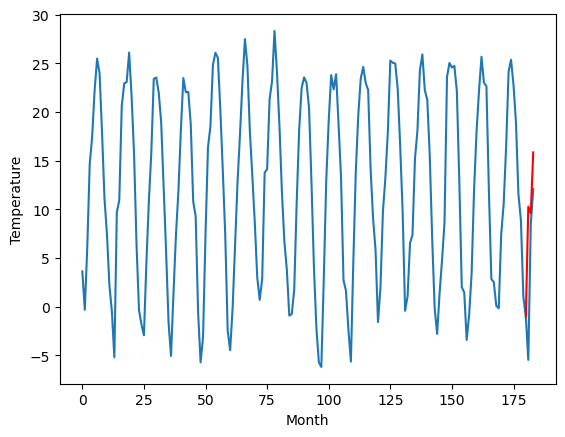

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.40		9.03		1.63
5.16		8.35		3.19
15.05		14.60		-0.45
[180, 181, 182, 183]
[-2.29, 9.034990764856339, 8.346942819356919, 14.60391084074974]


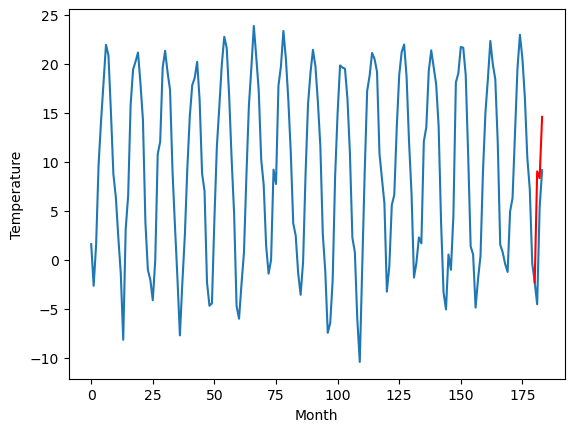

RangeIndex(start=1, stop=12, step=1)
[7.810000000000001, 8.339999999999998, 4.290000000000002, 2.7000000000000006, 4.289999999999999, 14.280000000000001, 11.719999999999999, 9.64, 10.11, 8.53, 7.4]
[9.034990764856339, 7.354990764856338, 3.9749907648563383, 3.3349907648563386, 4.604990764856338, 15.09499076485634, 11.204990764856339, 11.024990764856339, 11.404990764856338, 10.274990764856339, 9.034990764856339]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    7.81   9.034991
1                 1    8.34   7.354991
2                 2    4.29   3.974991
3                 3    2.70   3.334991
4                 4    4.29   4.604991
5                 5   14.28  15.094991
6                 6   11.72  11.204991
7                 7    9.64  11.024991
8                 8   10.11  11.404991
9                 9    8.53  10.274991
10               10    7.40   9.034991


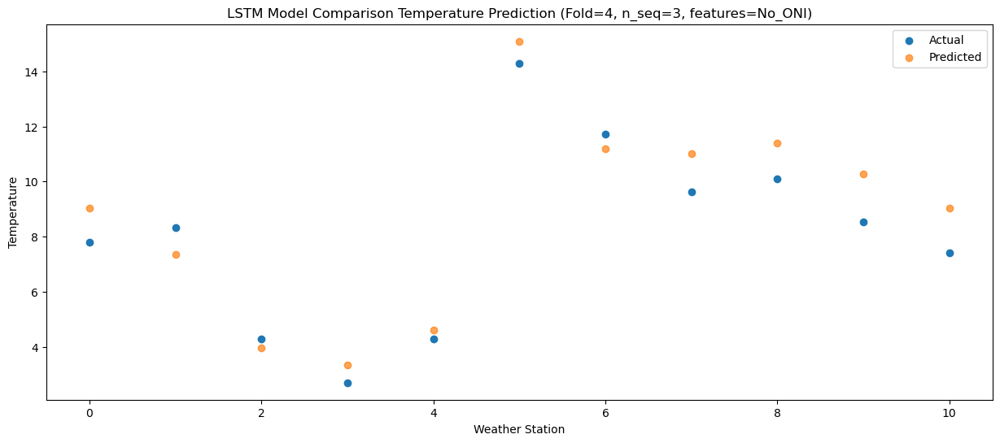

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.68   8.346943
1                 1   11.77   6.666943
2                 2    2.37   3.286943
3                 3   -0.76   2.646943
4                 4    0.40   3.916943
5                 5   12.71  14.406943
6                 6   12.39  10.516943
7                 7    6.03  10.336943
8                 8    6.75  10.716943
9                 9    4.09   9.586943
10               10    5.16   8.346943


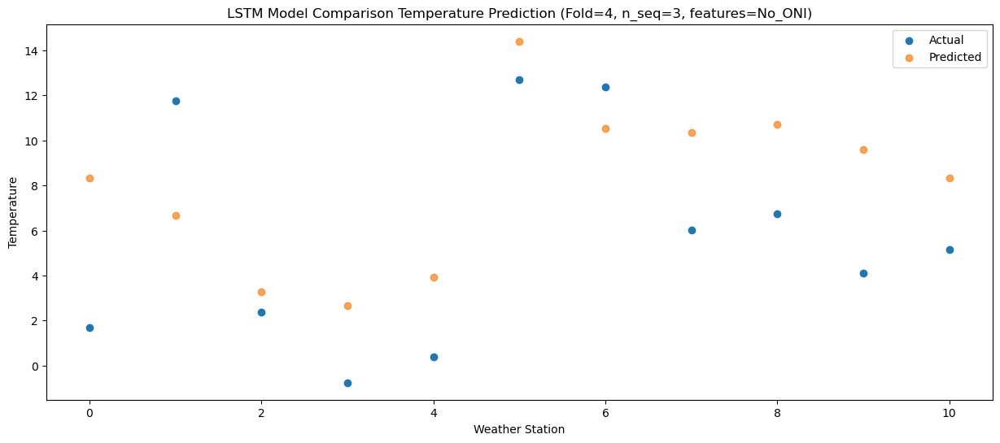

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.41  14.603911
1                 1   13.37  12.923911
2                 2   11.70   9.543911
3                 3   10.20   8.903911
4                 4   11.32  10.173911
5                 5   21.96  20.663911
6                 6   18.79  16.773911
7                 7   18.30  16.593911
8                 8   18.72  16.973911
9                 9   17.95  15.843911
10               10   15.05  14.603911


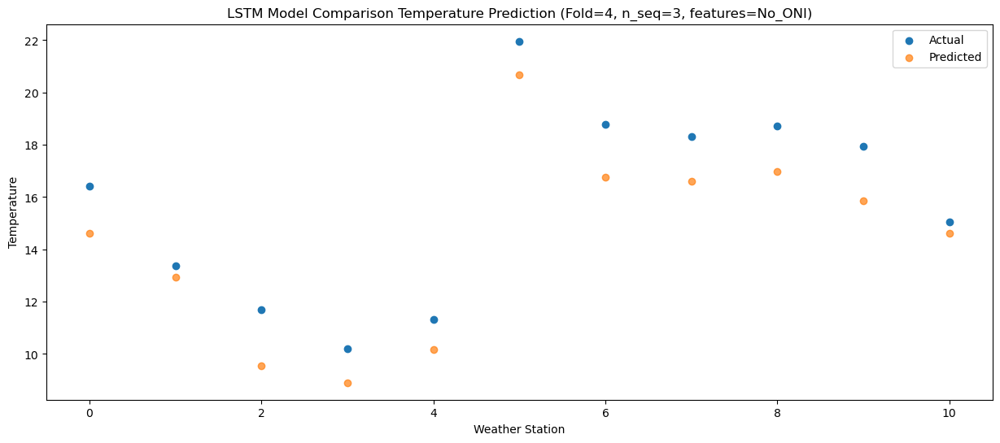

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_16 (LSTM)              (1, 1, 1024)              12263424  
                                                                 
 dropout_16 (Dropout)        (1, 1, 1024)              0         
                                                                 
 lstm_17 (LSTM)              (1, 1024)                 8392704   
                                                                 
 dropout_17 (Dropout)        (1, 1024)                 0         
                                                                 
 dense_24 (Dense)            (1, 256)                  262400    
                                                                 
 dense_25 (Dense)            (1, 128)                  32896     
                                                                 
 dense_26 (Dense)            (1, 3)                   

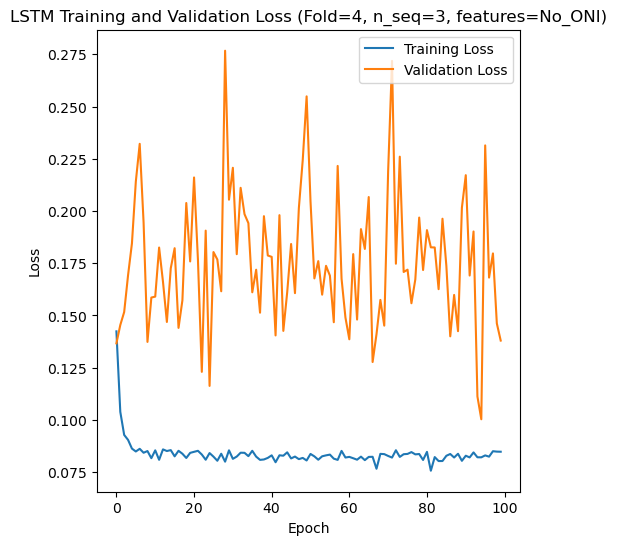

[[0.9004495048522702, 2.5762984803963795, 1.2750349399243248], [0.7692815094236414, 2.464378708480081, 1.4693159556471382], [1.5990864678142822, 2.9213821166015026, 2.779933904076646], [1.3754732072534637, 5.17189930604401, 2.994518537631021], [1.1002206955635343, 4.004015986901209, 1.5794613231421786]]
[[0.6866250796751543, 2.3012264576825237, 1.0826975922151052], [0.7122725794532079, 2.0922399074381057, 1.2218030639128257], [1.5400598686391662, 2.5150693489204756, 1.9822950988466095], [1.0910165422612967, 4.137281967509877, 2.2145929111133924], [0.9877230749346992, 3.648963612318038, 1.4697255228866226]]
[[0.08745514812579325, 0.34536182452776226, 0.06584711427885759], [0.07804454054028408, 0.23341667146785952, 0.06936308322899497], [0.201535577546089, 0.34289798941775973, 0.14780381890193509], [0.21204383940895097, 1.087631412416542, 0.333153353720151], [0.13229841222822686, 1.9647555303082749, 0.09598264492950692]]
[[0.8703464936576243, 0.39533599216562765, 0.7828827417777074], [0.

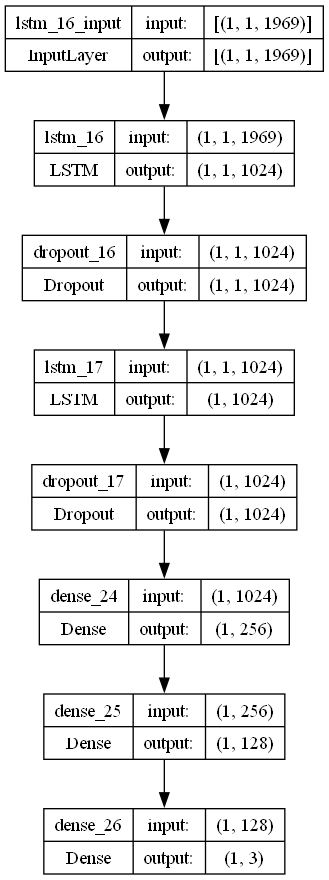

In [3]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr = 0.08086925642179353
    optimizer = SGD(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.24903855147965848

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# make one forecast with an LSTM,
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_ONI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S3_No_ONI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

In [1]:
import tensorflow as tf
import numpy as np
from numpy import array
import keras.backend as K

def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))

actual_results = [[[7.83942482471466, 5.836508965492248, 14.436702942848205], [6.859424824714661, 4.856508965492249, 13.456702942848207], [5.479424824714661, 3.4765089654922487, 12.076702942848206], [4.279424824714661, 2.2765089654922486, 10.876702942848205], [11.199424824714661, 9.19650896549225, 17.796702942848206], [13.50942482471466, 11.506508965492248, 20.106702942848205], [7.899424824714661, 5.896508965492249, 14.496702942848206], [13.219424824714661, 11.216508965492249, 19.816702942848206], [12.289424824714661, 10.28650896549225, 18.886702942848206], [9.77942482471466, 7.776508965492248, 16.376702942848205], [7.83942482471466, 5.836508965492248, 14.436702942848205]], [[8.447857375144958, 6.109072203636169, 14.62001847743988], [7.017857375144959, 4.67907220363617, 13.190018477439882], [8.257857375144958, 5.919072203636169, 14.43001847743988], [7.2878573751449585, 4.949072203636169, 13.460018477439881], [11.527857375144958, 9.189072203636169, 17.70001847743988], [7.677857375144958, 5.339072203636169, 13.85001847743988], [10.147857375144959, 7.80907220363617, 16.32001847743988], [14.03785737514496, 11.69907220363617, 20.21001847743988], [12.747857375144958, 10.40907220363617, 18.920018477439882], [12.277857375144958, 9.939072203636169, 18.45001847743988], [8.447857375144958, 6.109072203636169, 14.62001847743988]], [[10.575482382774354, 10.314237161874772, 17.684917970895768], [5.205482382774353, 4.944237161874771, 12.314917970895767], [10.475482382774352, 10.21423716187477, 17.584917970895766], [7.005482382774353, 6.744237161874771, 14.114917970895767], [7.0454823827743525, 6.7842371618747705, 14.154917970895767], [4.715482382774353, 4.454237161874771, 11.824917970895768], [16.255482382774353, 15.994237161874771, 23.364917970895767], [1.1154823827743532, 0.8542371618747713, 8.224917970895767], [12.375482382774353, 12.11423716187477, 19.484917970895765], [12.485482382774354, 12.224237161874772, 19.594917970895768], [10.575482382774354, 10.314237161874772, 17.684917970895768]], [[-9.368818035125733, -13.564455738067627, -0.8099419975280764], [8.441181964874268, 4.245544261932373, 17.000058002471924], [7.911181964874267, 3.715544261932372, 16.470058002471923], [2.0711819648742678, -2.1244557380676268, 10.630058002471923], [7.771181964874268, 3.5755442619323734, 16.330058002471922], [5.891181964874267, 1.6955442619323726, 14.450058002471923], [6.521181964874268, 2.3255442619323734, 15.080058002471924], [5.441181964874268, 1.2455442619323733, 14.000058002471924], [3.1211819648742676, -1.074455738067627, 11.680058002471924], [4.201181964874268, 0.005544261932373118, 12.760058002471924], [-9.368818035125733, -13.564455738067627, -0.8099419975280764]], [[9.034990764856339, 8.346942819356919, 14.60391084074974], [7.354990764856338, 6.666942819356918, 12.923910840749741], [3.9749907648563383, 3.286942819356918, 9.54391084074974], [3.3349907648563386, 2.6469428193569184, 8.903910840749742], [4.604990764856338, 3.916942819356918, 10.173910840749741], [15.09499076485634, 14.40694281935692, 20.663910840749743], [11.204990764856339, 10.516942819356919, 16.773910840749743], [11.024990764856339, 10.336942819356919, 16.593910840749743], [11.404990764856338, 10.716942819356918, 16.97391084074974], [10.274990764856339, 9.586942819356919, 15.843910840749741], [9.034990764856339, 8.346942819356919, 14.60391084074974]]]
forecast_results = [[[7.989999999999999, 4.639999999999997, 15.71], [8.53, 8.44, 13.499999999999996], [7.310000000000001, 8.170000000000002, 14.150000000000002], [5.3800000000000034, 3.810000000000003, 11.720000000000004], [11.33, 8.24, 18.139999999999997], [12.739999999999998, 13.389999999999997, 18.29], [8.33, 8.970000000000002, 15.950000000000003], [13.29, 13.91, 20.43], [12.51, 8.24, 20.71], [9.2, 7.029999999999999, 17.78], [7.24, 2.9300000000000015, 14.660000000000004]], [[9.54, 9.760000000000002, 14.74], [7.489999999999999, 8.149999999999999, 14.92], [9.35, 9.840000000000002, 16.900000000000006], [7.859999999999999, 6.2700000000000005, 13.64], [12.189999999999998, 10.489999999999998, 18.1], [6.84, 7.22, 14.560000000000002], [10.62, 11.4, 17.68], [14.4, 11.4, 22.72], [13.07, 8.29, 20.85], [13.06, 8.690000000000001, 19.4], [7.279999999999999, 6.32, 13.54]], [[11.88, 7.48, 19.9], [6.69, 2.6500000000000004, 12.840000000000002], [12.7, 15.43, 17.24], [5.490000000000001, 5.5100000000000025, 9.620000000000001], [8.96, 8.22, 15.55], [5.69, 3.339999999999999, 11.719999999999999], [17.12, 14.010000000000002, 24.380000000000003], [3.2200000000000015, 6.140000000000003, 9.240000000000004], [13.880000000000003, 12.960000000000003, 12.560000000000002], [13.64, 14.139999999999999, 21.019999999999996], [12.47, 13.820000000000002, 20.030000000000005]], [[-8.520000000000001, -8.15, -1.3500000000000005], [8.420000000000002, 4.700000000000002, 16.67], [10.299999999999999, 12.599999999999998, 13.749999999999996], [1.7399999999999998, 0.41999999999999904, 10.629999999999999], [7.430000000000001, 3.5599999999999996, 16.639999999999997], [5.5699999999999985, 2.8499999999999983, 14.179999999999998], [7.92, 8.020000000000001, 10.99], [7.119999999999999, 9.969999999999999, 11.569999999999999], [5.4700000000000015, 6.400000000000002, 6.180000000000004], [2.3099999999999996, 2.189999999999999, 7.189999999999998], [-9.8, -10.600000000000001, -3.410000000000002]], [[7.810000000000001, 1.6800000000000015, 16.41], [8.339999999999998, 11.77, 13.370000000000001], [4.290000000000002, 2.37, 11.7], [2.7000000000000006, -0.7600000000000002, 10.199999999999998], [4.289999999999999, 0.3999999999999999, 11.320000000000002], [14.280000000000001, 12.71, 21.96], [11.719999999999999, 12.389999999999999, 18.79], [9.64, 6.030000000000001, 18.3], [10.11, 6.75, 18.72], [8.53, 4.09, 17.950000000000003], [7.4, 5.16, 15.05]]]
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Average PEARSON:"+str(p1))

[ 7.83942482e+00  5.83650897e+00  1.44367029e+01  6.85942482e+00
  4.85650897e+00  1.34567029e+01  5.47942482e+00  3.47650897e+00
  1.20767029e+01  4.27942482e+00  2.27650897e+00  1.08767029e+01
  1.11994248e+01  9.19650897e+00  1.77967029e+01  1.35094248e+01
  1.15065090e+01  2.01067029e+01  7.89942482e+00  5.89650897e+00
  1.44967029e+01  1.32194248e+01  1.12165090e+01  1.98167029e+01
  1.22894248e+01  1.02865090e+01  1.88867029e+01  9.77942482e+00
  7.77650897e+00  1.63767029e+01  7.83942482e+00  5.83650897e+00
  1.44367029e+01  8.44785738e+00  6.10907220e+00  1.46200185e+01
  7.01785738e+00  4.67907220e+00  1.31900185e+01  8.25785738e+00
  5.91907220e+00  1.44300185e+01  7.28785738e+00  4.94907220e+00
  1.34600185e+01  1.15278574e+01  9.18907220e+00  1.77000185e+01
  7.67785738e+00  5.33907220e+00  1.38500185e+01  1.01478574e+01
  7.80907220e+00  1.63200185e+01  1.40378574e+01  1.16990722e+01
  2.02100185e+01  1.27478574e+01  1.04090722e+01  1.89200185e+01
  1.22778574e+01  9.93907